# TMY - Girasol

In [1]:
import pandas as pd 
import numpy as np
import os

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from tabulate import tabulate

import calendar
from IPython.display import Image

In [2]:
month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]

## Carga de datos

In [5]:
path = "./"
filelist = os.listdir(path)

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

# TMY

Cargamos los datos del año de referencia

In [6]:
tmy = pd.read_csv(path + 'SG-91882-2107-1-1_TMY_P50.csv', usecols = ['Month','GlobHor (Solargis)','T_Amb (solargis)'], sep = ';',decimal=",")
tmy = tmy[:12]
tmy = tmy.set_index('Month')
tmy = tmy.rename(columns={'GlobHor (Solargis)': 'GlobHor', 'T_Amb (solargis)' : 'T_Amb'})
tmy['month'] = bn
tmy

,GlobHor,T_Amb,month
Month,,,
1,143.7,26.3,January
2,152.7,26.4,February
3,189.2,26.2,March
4,198.4,27.0,April
5,199.4,28.4,May
6,203.3,29.6,June
7,212.5,30.9,July
8,204.0,30.2,August
9,178.3,30.1,September


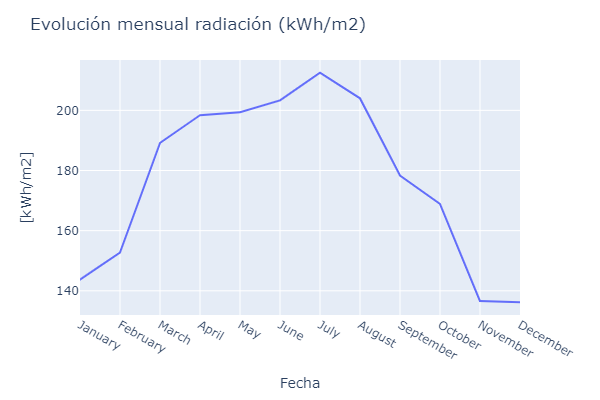

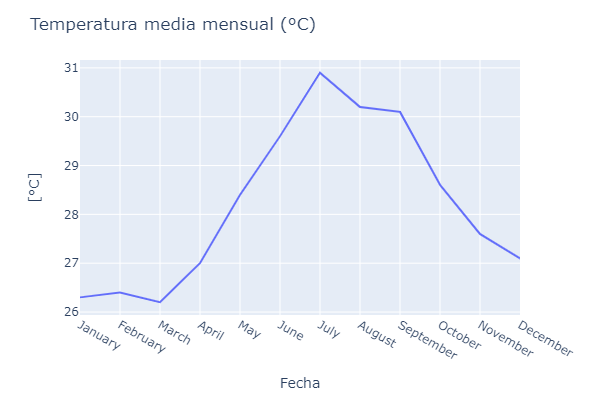

In [16]:
fig = px.line(tmy, x = 'month', y = 'GlobHor', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Evolución mensual radiación (kWh/m2)',xaxis_title="Fecha",yaxis_title="[kWh/m2]")
fig.show()
display(Image("./img/newplot.png"))

fig = px.line(tmy, x = 'month', y = 'T_Amb', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Temperatura media mensual (°C)',xaxis_title="Fecha",yaxis_title="[°C]")
fig.show()
display(Image("./img/plot1.png"))

In [17]:
tmygh = tmy['GlobHor'].tolist()
tmyt = tmy['T_Amb'].tolist()
tmygh.append(np.sum(tmygh))

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

# Timeseries

In [18]:
df = pd.read_csv('./TIMESERIES-10Y-PVGIS.csv', skiprows = [0,1,2,3,4,5,6,7], low_memory=False)
df = df[:96408]
df['time']= pd.to_datetime(df['time'],  format = '%Y%m%d:%H%M')
df['G(i)'] = pd.to_numeric(df['G(i)'])

# creamos la columna mes, año y hora 

df['Year'] = df['time'].dt.year
df['Month'] = df['time'].dt.month
df['Hour'] = df['time'].dt.hour

print('Contamos con los siguientes años', df['time'].dt.year.unique())

Contamos con los siguientes años [2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]


In [19]:
# corregimos la hora por utc: UTC - 4

# no lo hacemos de momento ya que no es necesario para obtener el acumulado para cada mes de cada año. 

Queremos obtener el acumulado para cada mes de cada año

In [20]:
# definimos el dataset que se corresponde al acumulado agrupando por Mes y Año, realizando la suma 

dfpym = ((df.groupby(['Year','Month'], as_index = False)).sum())
# creamos columna año mes 
dfpym['Date'] = pd.to_datetime(dfpym[['Year', 'Month']].assign(DAY=1))

# calculamos el acumulado
dfpym['G_rad'] = dfpym['G(i)']*60/60/1000
df['G_rad'] = df['G(i)']*60/60/1000

# creamos la media por hora para Gb

dfpymhour = df.groupby(['Hour'], as_index = False).mean()


# creamos el acumulado por hora para cada GHI

dfpymhourrad = (df.groupby(['Hour'], as_index = False).sum())
dfpymhourrad['G_rad'] = dfpymhourrad['G(i)']*60/60/1000



# creamos el sumatorio para calcular el total de radiación/irradiancia de todos los meses

sumdfpymmonth = (dfpym.groupby(['Month'], as_index = False).sum())
sumdfpymmyear = (dfpym.groupby(['Year'], as_index = False).sum())


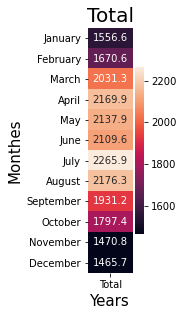

In [21]:
dfnew = pd.DataFrame()
dfnew['Total'] = np.round(sumdfpymmonth['G_rad'],2)
dfnew.index = bn

plt.figure(figsize = (1,4.5))

ax = sns.heatmap(dfnew, annot = True, fmt='.5')
plt.title('Total', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

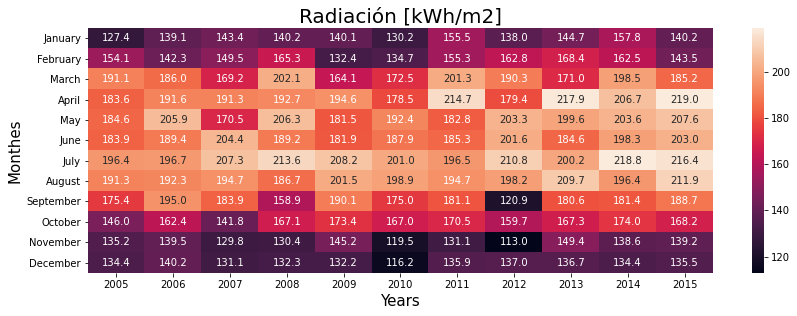

+-----------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+---------+
| Month     |   2005 |   2006 |   2007 |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |   Total |
+===========+========+========+========+========+========+========+========+========+========+========+========+=========+
| January   | 127.4  | 139.07 | 143.38 | 140.23 | 140.13 | 130.16 | 155.55 | 137.98 | 144.75 | 157.77 | 140.19 | 1556.62 |
+-----------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+---------+
| February  | 154.1  | 142.26 | 149.47 | 165.35 | 132.38 | 134.68 | 155.28 | 162.79 | 168.38 | 162.45 | 143.5  | 1670.63 |
+-----------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+---------+
| March     | 191.05 | 186.02 | 169.19 | 202.14 | 164.13 | 172.54 | 201.28 | 190.28 | 171.03 | 198.5  | 185.18 | 2031.33 |
+-----------+---

Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Month,,,,,,,,,,,
1,127.40311,139.07097,143.38486,140.22770,140.13434,130.15902,155.54656,137.97918,144.74770,157.77114,140.19262
2,154.10178,142.25741,149.46672,165.34795,132.38133,134.68337,155.27678,162.78688,168.37916,162.45396,143.49555
3,191.05332,186.01956,169.18595,202.13696,164.12906,172.54258,201.27802,190.28354,171.02570,198.49545,185.18009
4,183.55102,191.62089,191.29692,192.68210,194.60489,178.46832,214.69224,179.36199,217.94494,206.73569,218.97486
5,184.60600,205.87000,170.46600,206.34800,181.48600,192.36900,182.75700,203.27600,199.56800,203.59600,207.56021
6,183.89139,189.44368,204.41246,189.18516,181.89800,187.91895,185.31148,201.62689,184.63800,198.34465,202.96231
7,196.44701,196.65631,207.34971,213.57968,208.19220,200.96403,196.45956,210.84737,200.15500,218.82629,216.39428
8,191.33100,192.31200,194.73400,186.65000,201.53900,198.86100,194.67200,198.22800,209.69900,196.36800,211.94176
9,175.44404,195.01314,183.86565,158.94877,190.07748,175.03774,181.08781,120.93804,180.62326,181.43872,188.73017


In [22]:
month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]


heatmapr = dfpym.pivot('Month', 'Year', 'G_rad')
heatmapr.index = bn
#heatmapr['Total'] = np.round(sumdfpymmonth['Gb_rad'].tolist(),2)

plt.figure(figsize = (14,4.5))

ax = sns.heatmap(heatmapr, annot = True, fmt='.4')
plt.title('Radiación [kWh/m2]', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

info = {'Month': bn, '2005': np.round(dfpym[dfpym['Year']==2005]['G_rad'],2),
            '2006': np.round(dfpym[dfpym['Year']==2006]['G_rad'],2),
            '2007': np.round(dfpym[dfpym['Year']==2007]['G_rad'],2),
            '2008': np.round(dfpym[dfpym['Year']==2008]['G_rad'],2),
            '2009': np.round(dfpym[dfpym['Year']==2009]['G_rad'],2), 
            '2010': np.round(dfpym[dfpym['Year']==2010]['G_rad'],2),
            '2011': np.round(dfpym[dfpym['Year']==2011]['G_rad'],2), 
            '2012': np.round(dfpym[dfpym['Year']==2012]['G_rad'],2), 
            '2013': np.round(dfpym[dfpym['Year']==2013]['G_rad'],2), 
            '2014': np.round(dfpym[dfpym['Year']==2014]['G_rad'],2), 
            '2015' : np.round(dfpym[dfpym['Year']==2015]['G_rad'],2),'Total': np.round(sumdfpymmonth['G_rad'],2)}

print(tabulate(info, headers='keys', tablefmt='grid'))

dfpym.pivot('Month', 'Year', 'G_rad')

In [12]:
excel = dfpym.pivot('Month', 'Year', 'G_rad')
excel['Total'] = np.round(sumdfpymmonth['G_rad'],2)
excel.to_excel(r'./Rad_pvgis.xlsx', index = True)

## Representaciones

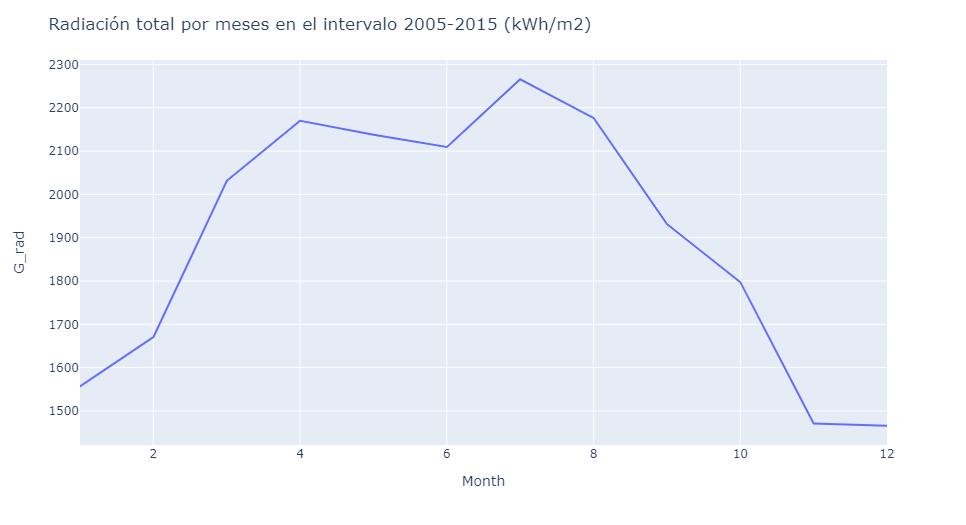

In [23]:
fig = px.line(sumdfpymmonth, x = 'Month', y = 'G_rad' )#,marginal_y="violin")
fig.update_layout(title='Radiación total por meses en el intervalo 2005-2015 (kWh/m2)')
fig.show()
display(Image("./img/plot2.png"))

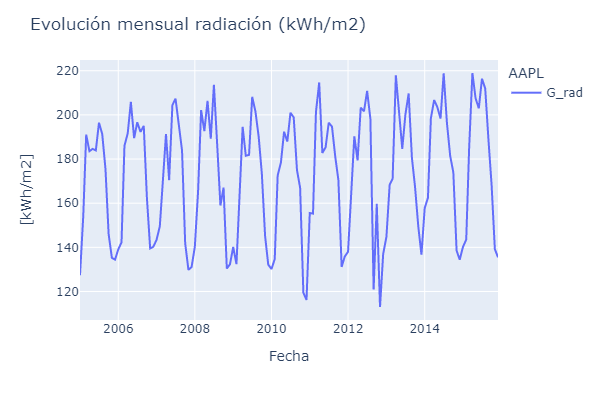

In [25]:
df1 = dfpym.melt(id_vars=['Date'], 
                        value_vars = ['G_rad'],
                        var_name='AAPL')

fig = px.line(df1, x = 'Date', y = 'value', color = 'AAPL', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Evolución mensual radiación (kWh/m2)',xaxis_title="Fecha",yaxis_title="[kWh/m2]")
fig.show()
display(Image("./img/plot3.png"))

In [26]:
# Realizamos el cambio de UTC - 4h

dfpymhourrad['Hourutc'] = dfpymhourrad['Hour'] - 4
dfpymhourrad['Hourutc'][0] = 20
dfpymhourrad['Hourutc'][1] = 21
dfpymhourrad['Hourutc'][2] = 22
dfpymhourrad['Hourutc'][3] = 23

<ipython-input-26-c7359436df63>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-26-c7359436df63>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-26-c7359436df63>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-26-c7359436df63>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pand

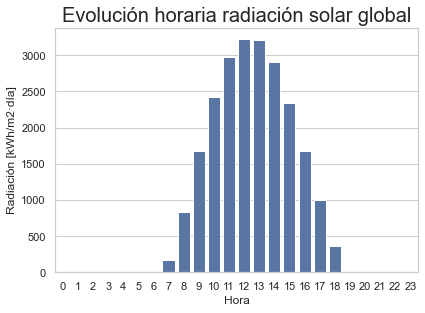

In [16]:
df1 = dfpymhourrad.melt(id_vars=['Hourutc'], 
                        value_vars = ['G_rad'],
                        var_name='AAPL')

plt.figure(figsize = (6.5,4.5))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hourutc", y="value", hue="AAPL", data=df1)
plt.xlabel("Hora");
plt.ylabel("Radiación [kWh/m2·día]");
plt.legend([],[], frameon=False)
plt.title('Evolución horaria radiación solar global', fontsize = 20);

In [17]:
#fig = px.scatter(df, x="time", y="Hour", color='G(h)',
#                 title="Irradiance global [W/m2]")
#
#fig.show()

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

# Desviaciones

Determinamos la desviación de cada mes de cada año con respecto al año de referencia. 


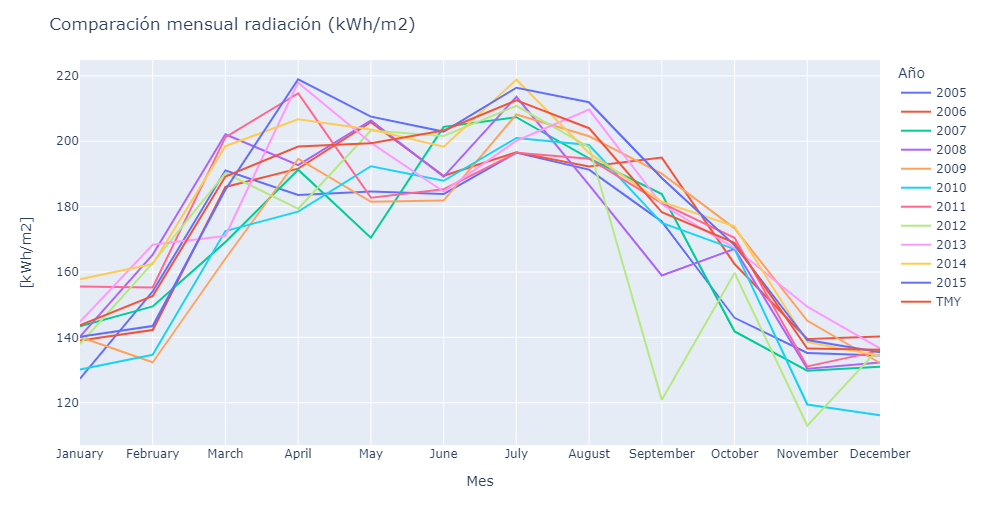

In [27]:
prueba = dfpym.pivot('Month', 'Year', 'G_rad')
prueba['TMY'] = tmy['GlobHor'].tolist()
prueba['month'] = bn

df1 = prueba.melt(id_vars=['month'], 
                        value_vars = prueba.columns[:-1],
                        var_name='Año')

fig = px.line(df1, x = 'month', y = 'value', color = 'Año')#,marginal_y="violin")
fig.update_layout(title='Comparación mensual radiación (kWh/m2)',xaxis_title="Mes",yaxis_title="[kWh/m2]")
fig.show()
display(Image("./img/plot4.png"))

In [19]:
years = dfpym['Year'].unique().tolist()
j = 'G_rad'

listmony = []
percentual = []
for i in years:
    m = dfpym[dfpym['Year']==i][j]
    arr = np.array([m, tmygh[:-1]])
    listmony.append(np.std(arr, axis=0))
    percentual.append((np.std(arr, axis=0)/tmygh[:-1])*100)

info = {'Month': bn, '2005': listmony[0],
            '2006': listmony[1],
            '2007': listmony[2],
            '2008': listmony[3],
            '2009': listmony[4],
            '2010': listmony[5],
            '2011': listmony[6],
            '2012': listmony[7], 
            '2013': listmony[8],
            '2014': listmony[9], 
            '2015' : listmony[10]}

print('Desviación estándar para cada mes del año con respecto a TMY', j)
print(tabulate(info, headers='keys', tablefmt='grid'))

info = {'Month': bn, '2005': np.round(percentual[0],2),
            '2006': np.round(percentual[1],2),
            '2007': np.round(percentual[2],2),
            '2008': np.round(percentual[3],2),
            '2009': np.round(percentual[4],2),
            '2010': np.round(percentual[5],2),
            '2011': np.round(percentual[6],2),
            '2012': np.round(percentual[7],2), 
            '2013': np.round(percentual[8],2),
            '2014': np.round(percentual[9],2), 
            '2015' : np.round(percentual[10],2)}

print('Desviaciones estándar para cada mes de cada año con respecto el año de referencia (en %)', j)
print(tabulate(info, headers='keys', tablefmt='grid'))

Desviación estándar para cada mes del año con respecto a TMY G_rad
+-----------+-----------+---------+----------+---------+----------+----------+----------+-----------+---------+---------+-----------+
| Month     |      2005 |    2006 |     2007 |    2008 |     2009 |     2010 |     2011 |      2012 |    2013 |    2014 |      2015 |
+===========+===========+=========+==========+=========+==========+==========+==========+===========+=========+=========+===========+
| January   |  8.14845  | 2.31452 |  0.15757 | 1.73615 |  1.78283 |  6.77049 | 5.92328  |  2.86041  | 0.52385 | 7.03557 |  1.75369  |
+-----------+-----------+---------+----------+---------+----------+----------+----------+-----------+---------+---------+-----------+
| February  |  0.70089  | 5.2213  |  1.61664 | 6.32397 | 10.1593  |  9.00832 | 1.28839  |  5.04344  | 7.83958 | 4.87698 |  4.60223  |
+-----------+-----------+---------+----------+---------+----------+----------+----------+-----------+---------+---------+--------

# Temperaturas

In [28]:
tempym = (df.groupby(['Year','Month'], as_index = False).mean())

tempym['Date'] = pd.to_datetime(tempym[['Year', 'Month']].assign(DAY=1))

# creamos el promedio de todos los meses

tempymmonth = (tempym.groupby(['Month'], as_index = False).mean())

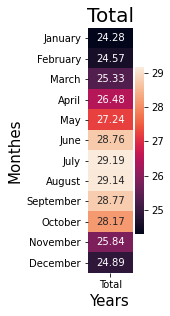

In [29]:
dfnew = pd.DataFrame()
dfnew['Total'] =  np.round(tempymmonth['T2m'].tolist(),2)
dfnew.index = bn

plt.figure(figsize = (1,4.5))

ax = sns.heatmap(dfnew, annot = True, fmt='.5')
plt.title('Total', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

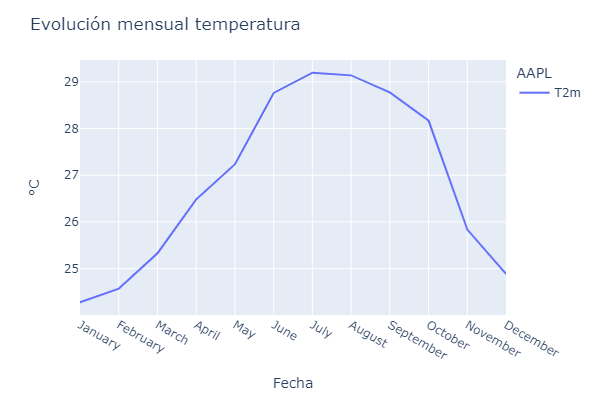

In [31]:
tempymmonth['Month'] = bn
df1 = tempymmonth.melt(id_vars=['Month'], 
                        value_vars = ['T2m'],
                        var_name='AAPL')

fig = px.line(df1, x = 'Month', y = 'value', color = 'AAPL', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Evolución mensual temperatura',xaxis_title="Fecha",yaxis_title="°C")
fig.show()
display(Image("./img/plot5.png"))

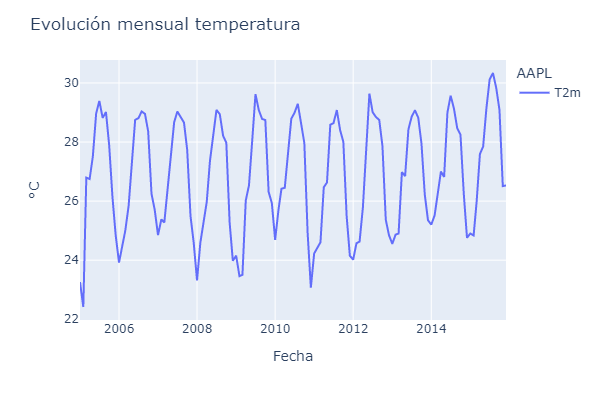

In [32]:
df1 = tempym.melt(id_vars=['Date'], 
                        value_vars = ['T2m'],
                        var_name='AAPL')

fig = px.line(df1, x = 'Date', y = 'value', color = 'AAPL', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Evolución mensual temperatura',xaxis_title="Fecha",yaxis_title="°C")
fig.show()
display(Image("./img/plot6.png"))

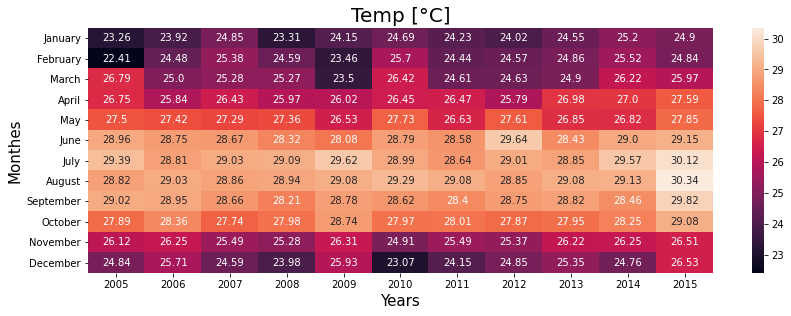

+-----------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+
| Month     |    2005 |    2006 |    2007 |    2008 |    2009 |    2010 |    2011 |    2012 |    2013 |    2014 |    2015 |   Total |
+===========+=========+=========+=========+=========+=========+=========+=========+=========+=========+=========+=========+=========+
| January   | 23.2601 | 23.9181 | 24.8468 | 23.312  | 24.153  | 24.6869 | 24.2257 | 24.0163 | 24.5541 | 25.2043 | 24.9026 | 24.28   |
+-----------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+
| February  | 22.4139 | 24.4819 | 25.3811 | 24.5897 | 23.4591 | 25.7032 | 24.443  | 24.5732 | 24.865  | 25.5156 | 24.8352 | 24.5692 |
+-----------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+
| March     | 26.7939 | 25.0036 | 25.2765 | 25.273  | 23.5043 

In [33]:
month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]

heatmapr = tempym.pivot('Month', 'Year', 'T2m')
heatmapr.index = bn

plt.figure(figsize = (14,4.5))

ax = sns.heatmap(heatmapr, annot = True, fmt='.4')
plt.title('Temp [°C]', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

info = {'Month': bn, '2005': tempym[tempym['Year']==2005]['T2m'],
            '2006': tempym[tempym['Year']==2006]['T2m'],
            '2007': tempym[tempym['Year']==2007]['T2m'],
            '2008': tempym[tempym['Year']==2008]['T2m'],
            '2009': tempym[tempym['Year']==2009]['T2m'], 
            '2010': tempym[tempym['Year']==2010]['T2m'],
            '2011': tempym[tempym['Year']==2011]['T2m'], 
            '2012':tempym[tempym['Year']==2012]['T2m'], 
            '2013': tempym[tempym['Year']==2013]['T2m'], 
            '2014': tempym[tempym['Year']==2014]['T2m'], 
            '2015' : tempym[tempym['Year']==2015]['T2m'],'Total': tempymmonth['T2m']}


print(tabulate(info, headers='keys', tablefmt='grid'))


In [25]:
excel = tempym.pivot('Month', 'Year', 'T2m')
excel['Total'] = np.round(tempymmonth['T2m'],2)
excel.to_excel(r'./Temp_pvgis.xlsx', index = True)

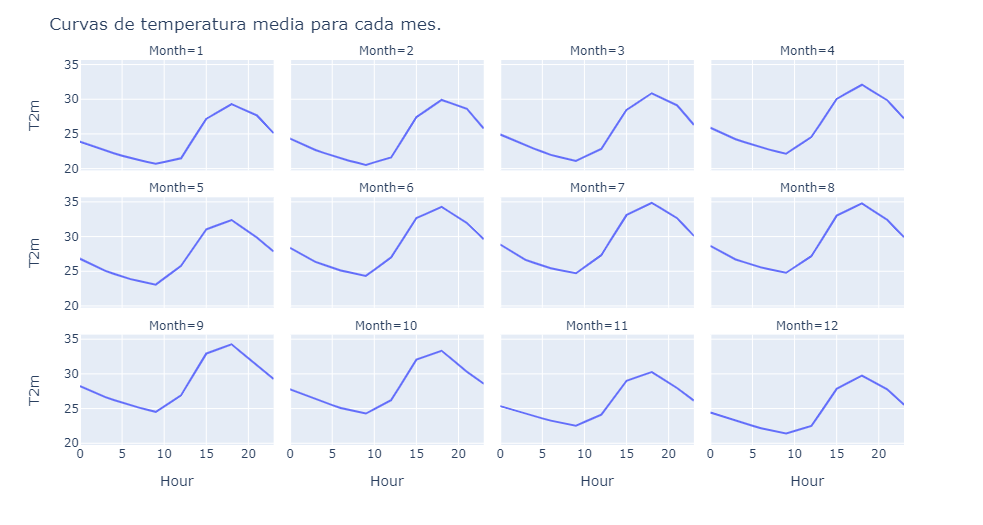

In [35]:
facet = (df.groupby(['Month','Hour'], as_index = False).mean())

fig = px.line(facet, x = 'Hour', y = 'T2m', facet_col="Month", facet_col_wrap = 4)
fig.update_layout(title=('Curvas de temperatura media para cada mes.'))
fig.show()
display(Image("./img/plot7.png"))

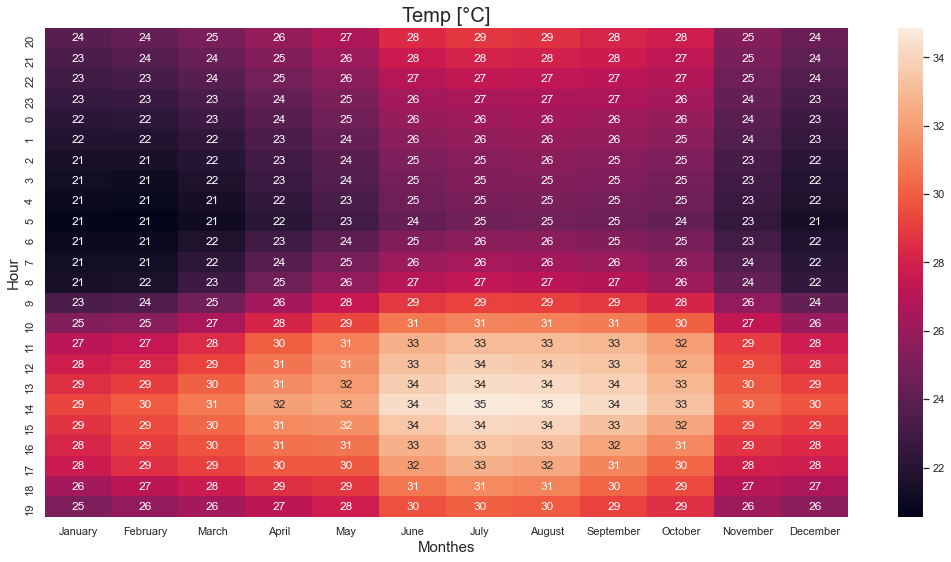

In [27]:
heatmapr = facet.pivot('Hour', 'Month', 'T2m')

heatmapr['hourutc'] = dfpymhourrad['Hourutc']
heatmapr = heatmapr.set_index('hourutc')
heatmapr.columns = bn

plt.figure(figsize = (18,9))

ax = sns.heatmap(heatmapr, annot = True)
plt.title('Temp [°C]', fontsize = 20) # title with fontsize 20
plt.ylabel('Hour', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

## desviaciones frente a tmy

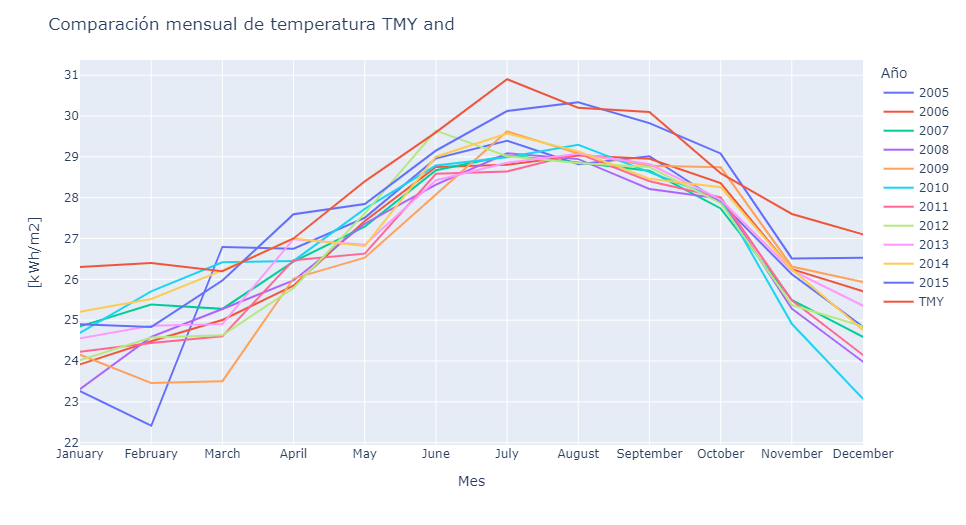

In [37]:
temp = df.groupby(['Month', 'Year'], as_index = False).mean()
temp = temp.pivot('Month', 'Year', 'T2m')
temp['TMY'] = tmy['T_Amb'].tolist()
temp['month'] = bn

df1 = temp.melt(id_vars=['month'], 
                        value_vars = temp.columns[:-1],
                        var_name='Año')

fig = px.line(df1, x = 'month', y = 'value', color = 'Año')#,marginal_y="violin")
fig.update_layout(title=('Comparación mensual de temperatura TMY and'), xaxis_title="Mes",yaxis_title="[kWh/m2]")
fig.show()
display(Image("./img/plot8.png"))

In [29]:
years = tempym['Year'].unique().tolist()


listmony = []
percentual = []

for i in years:
    m = tempym[tempym['Year']==i]['T2m']
    arr = np.array([m, tmyt])
    listmony.append(np.std(arr, axis=0))
    percentual.append((np.std(arr, axis=0)/tmyt)*100)
    


info = {'Month': bn, '2005': np.round(percentual[0],2),
            '2006': np.round(percentual[1],2),
            '2007': np.round(percentual[2],2),
            '2008': np.round(percentual[3],2),
            '2009': np.round(percentual[4],2),
            '2010': np.round(percentual[5],2),
            '2011': np.round(percentual[6],2),
            '2012': np.round(percentual[7],2), 
            '2013': np.round(percentual[8],2),
            '2014': np.round(percentual[9],2), 
            '2015' : np.round(percentual[10],2)}


print('Desviaciones estándar para cada mes de cada año con respecto el año de referencia (en %) Temp [°C]')
print(tabulate(info, headers='keys', tablefmt='grid'))



Desviaciones estándar para cada mes de cada año con respecto el año de referencia (en %) Temp [°C]
+-----------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+
| Month     |   2005 |   2006 |   2007 |   2008 |   2009 |   2010 |   2011 |   2012 |   2013 |   2014 |   2015 |
+===========+========+========+========+========+========+========+========+========+========+========+========+
| January   |   5.78 |   4.53 |   2.76 |   5.68 |   4.08 |   3.07 |   3.94 |   4.34 |   3.32 |   2.08 |   2.66 |
+-----------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+
| February  |   7.55 |   3.63 |   1.93 |   3.43 |   5.57 |   1.32 |   3.71 |   3.46 |   2.91 |   1.68 |   2.96 |
+-----------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+--------+
| March     |   1.13 |   2.28 |   1.76 |   1.77 |   5.14 |   0.42 |   3.04 |   3    |   2.48 |   0.03 |   0.44

## -------------------------------------------------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

## -------------------------------------------------------------------------------------------------------------------------------

## Datos campo

Definimos los dataset que vamos a emplear

In [38]:
# cargamos el dataset que contiene la información diezminutal para cada día de cada mes de cada año 

camp = pd.read_excel(path + filelist[6], sheet_name = 'WS')
camp['DateTime']= pd.to_datetime(camp['DateTime'],  format = '%m/%d/%Y %H:%M:%S')
camp['Date'] = camp['DateTime'].dt.date
col = camp.loc[:, camp.columns[8:10]]
camp['GHI'] = col.mean(axis=1)
print('Contamos con los siguientes años', camp['DateTime'].dt.year.unique())

# definimos el dataset que se corresponde al acumulado agrupando por Mes y Año, realizando la suma 

campym = (camp.groupby(['Year','Month'], as_index = False).sum())
# calculamos el acumulado
campym['GHI1_rad'] = campym['GHI1 [W/m2]']*10/60/1000
campym['GHI2_rad'] = campym['GHI2 [W/m2]']*10/60/1000
campym['GHI_rad'] = campym['GHI']*10/60/1000
# creamos columna año mes 
campym['Date'] = pd.to_datetime(campym[['Year', 'Month']].assign(DAY=1))

# descartamos el mes de Febrero de 2020 ya que contiene un menor número de registros 
campymb = campym[1:].drop(campym.index[[25]])

# realizamos cálculo de desviacón estándar entre ambos sensores (GHI1, GHI2) evaluada para el acumulado mensual de cada año
col = campymb.loc[:, campymb.columns[22:24]]
campymb['std'] = col.std(axis=1)
campymb['%'] = (campymb['std']/campymb['GHI_rad'])*100
# realizamos cálculo de desviacón estándar entre ambos sensores (GHI1, GHI2) evaluada para el acumulado mensual de cada año
col = campym.loc[:, campym.columns[22:24]]
campym['std'] = col.std(axis=1)
campym['%'] = (campym['std']/campym['GHI_rad'])*100

# creamos la media por hora para cada GHI

camphour = camp[1:].groupby(['Hour'], as_index = False).mean()

# creamos el acumulado por hora para cada GHI

camphourrad = (camp[1:].groupby(['Hour'], as_index = False).sum())
camphourrad['GHI1_rad'] = camphourrad['GHI1 [W/m2]']*10/60/1000
camphourrad['GHI2_rad'] = camphourrad['GHI2 [W/m2]']*10/60/1000
camphourrad['GHI_rad'] = camphourrad['GHI']*10/60/1000

# creamos el sumatorio para calcular el total de radiación/irradiancia de todos los meses

sumcampymmonth = (campymb.groupby(['Month'], as_index = False).sum())
sumcampymyear = (campymb.groupby(['Year'], as_index = False).sum())
# calculamos sus desviaciones 

col = sumcampymmonth.loc[:, campymb.columns[22:24]]
sumcampymmonth['std'] = col.std(axis=1)
sumcampymmonth['%'] = (sumcampymmonth['std']/sumcampymmonth['GHI_rad'])*100

Contamos con los siguientes años [2018 2019 2020 2021]


Hemos encontrado que no existen sufientes datos recogidos de irradiancia para el mes de Febrero de 2020, por lo que eliminaremos los registros.

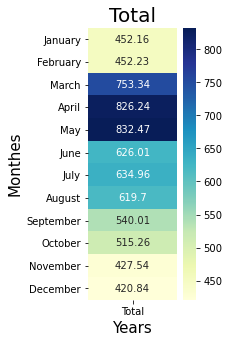

In [39]:
dfnew = pd.DataFrame()
dfnew['Total'] = sumcampymmonth['GHI_rad'].tolist()
dfnew.index = bn

plt.figure(figsize = (2,5))

ax = sns.heatmap(dfnew, annot = True, fmt='.5', cmap="YlGnBu")
plt.title('Total', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

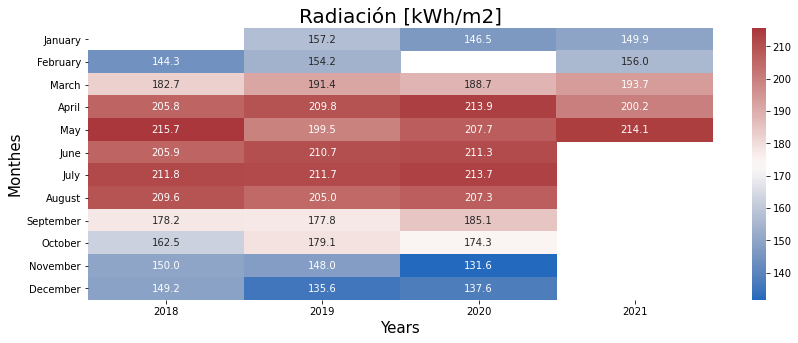

GHI1_rad
+-----------+---------+---------+---------+---------+---------+
| Month     |    2018 |    2019 |    2020 |    2021 |   Total |
+===========+=========+=========+=========+=========+=========+
| January   | nan     | 157.248 | 146.519 | 149.91  | 453.678 |
+-----------+---------+---------+---------+---------+---------+
| February  | 144.283 | 154.198 | nan     | 156.009 | 454.49  |
+-----------+---------+---------+---------+---------+---------+
| March     | 182.68  | 191.446 | 188.655 | 193.69  | 756.472 |
+-----------+---------+---------+---------+---------+---------+
| April     | 205.826 | 209.764 | 213.948 | 200.166 | 829.704 |
+-----------+---------+---------+---------+---------+---------+
| May       | 215.662 | 199.474 | 207.741 | 214.092 | 836.969 |
+-----------+---------+---------+---------+---------+---------+
| June      | 205.885 | 210.676 | 211.33  |         | 627.891 |
+-----------+---------+---------+---------+---------+---------+
| July      | 211.774 | 211.674

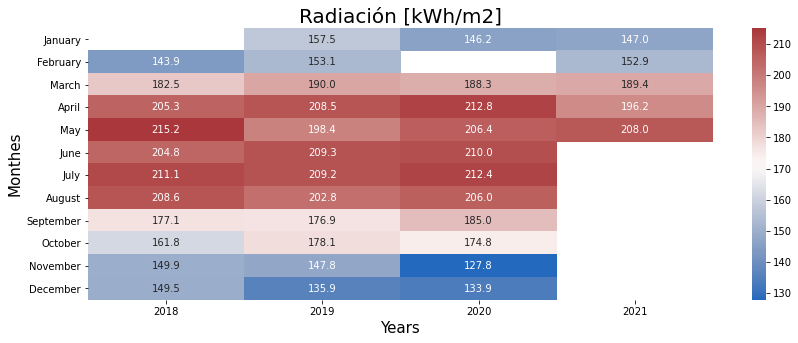

GHI2_rad
+-----------+---------+---------+---------+---------+---------+
| Month     |    2018 |    2019 |    2020 |    2021 |   Total |
+===========+=========+=========+=========+=========+=========+
| January   | nan     | 157.458 | 146.192 | 146.991 | 450.641 |
+-----------+---------+---------+---------+---------+---------+
| February  | 143.95  | 153.109 | nan     | 152.902 | 449.96  |
+-----------+---------+---------+---------+---------+---------+
| March     | 182.485 | 189.99  | 188.288 | 189.44  | 750.203 |
+-----------+---------+---------+---------+---------+---------+
| April     | 205.329 | 208.497 | 212.761 | 196.185 | 822.772 |
+-----------+---------+---------+---------+---------+---------+
| May       | 215.194 | 198.424 | 206.355 | 208.001 | 827.974 |
+-----------+---------+---------+---------+---------+---------+
| June      | 204.764 | 209.337 | 210.023 |         | 624.123 |
+-----------+---------+---------+---------+---------+---------+
| July      | 211.126 | 209.249

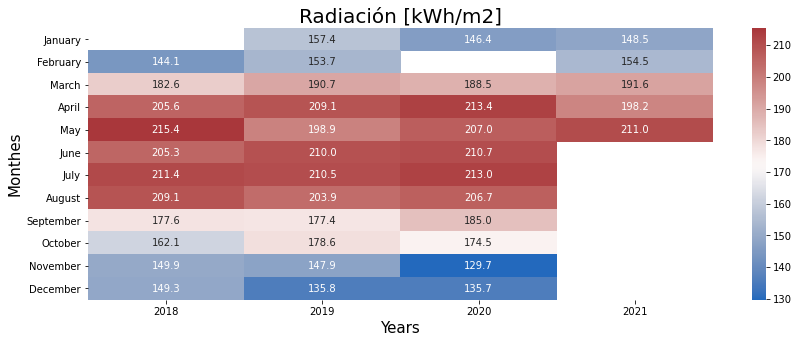

GHI_rad
+-----------+---------+---------+---------+---------+---------+
| Month     |    2018 |    2019 |    2020 |    2021 |   Total |
+===========+=========+=========+=========+=========+=========+
| January   | nan     | 157.353 | 146.356 | 148.451 | 452.159 |
+-----------+---------+---------+---------+---------+---------+
| February  | 144.116 | 153.654 | nan     | 154.455 | 452.225 |
+-----------+---------+---------+---------+---------+---------+
| March     | 182.583 | 190.718 | 188.472 | 191.565 | 753.337 |
+-----------+---------+---------+---------+---------+---------+
| April     | 205.578 | 209.13  | 213.354 | 198.175 | 826.238 |
+-----------+---------+---------+---------+---------+---------+
| May       | 215.428 | 198.949 | 207.048 | 211.047 | 832.472 |
+-----------+---------+---------+---------+---------+---------+
| June      | 205.324 | 210.006 | 210.676 |         | 626.007 |
+-----------+---------+---------+---------+---------+---------+
| July      | 211.45  | 210.462 

In [40]:
radcolumns = ['GHI1_rad', 'GHI2_rad', 'GHI_rad']
month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]

# eliminamos febrero de 2020 de los registros 

for j in radcolumns:
    campym.loc[(campym['Year']==2020) & (campym['Month'] == 2),j] = np.nan
    campym.loc[(campym['Year']==2018) & (campym['Month'] == 1),j] = np.nan
    
for j in radcolumns:
    heatmapr = campym.pivot('Month', 'Year', j)
    heatmapr.index = bn
    
    plt.figure(figsize = (14,5))
    
    ax = sns.heatmap(heatmapr, annot = True, fmt='.4', cmap="vlag")
    plt.title('Radiación [kWh/m2]', fontsize = 20) # title with fontsize 20
    plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
    plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
    plt.show()

    info = {'Month': bn, '2018': campym[campym['Year']==2018][j], '2019': campym[campym['Year']==2019][j],
        '2020' :campym[campym['Year']==2020][j], '2021': campym[campym['Year']==2021][j], 'Total': sumcampymmonth[j]}
    print(j)
    print(tabulate(info, headers='keys', tablefmt='grid'))
    
    

In [33]:
excel = campym.pivot('Month', 'Year', 'GHI_rad')
excel['Total'] = np.round(sumcampymmonth['GHI_rad'],2)
excel.to_excel(r'./rad_campo.xlsx', index = True)

Desviación estándar (std) entre ambos sensores (GHI1, GHI2) evaluada para el acumulado mensual de cada año
Porcentaje desviación entre ambos sensores (GHI1, GHI2) determinado como std/media


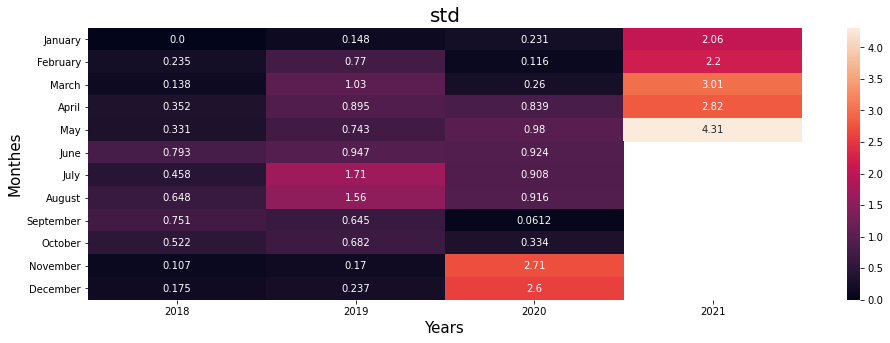

std
+-----------+----------+----------+----------+---------+----------+
| Month     |     2018 |     2019 |     2020 |    2021 |    Total |
+===========+==========+==========+==========+=========+==========+
| January   | 0.235325 | 0.147809 | 0.231214 | 2.06402 | 2.14742  |
+-----------+----------+----------+----------+---------+----------+
| February  | 0.138105 | 0.770434 | 0.259674 | 2.1973  | 3.20306  |
+-----------+----------+----------+----------+---------+----------+
| March     | 0.351504 | 1.02948  | 0.839252 | 3.0054  | 4.43266  |
+-----------+----------+----------+----------+---------+----------+
| April     | 0.330988 | 0.895364 | 0.97994  | 2.81545 | 4.90157  |
+-----------+----------+----------+----------+---------+----------+
| May       | 0.793046 | 0.742592 | 0.924327 | 4.30717 | 6.36069  |
+-----------+----------+----------+----------+---------+----------+
| June      | 0.45793  | 0.946563 | 0.907928 |         | 2.66394  |
+-----------+----------+----------+---------

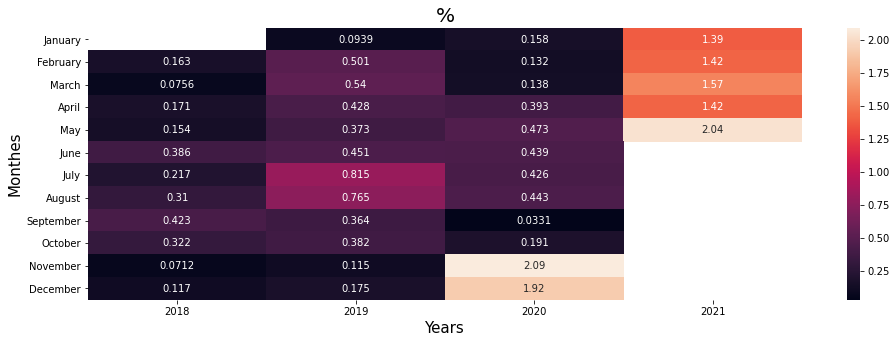

%
+-----------+-----------+-----------+-----------+---------+----------+
| Month     |      2018 |      2019 |      2020 |    2021 |    Total |
+===========+===========+===========+===========+=========+==========+
| January   | 0.163289  | 0.0939348 | 0.157981  | 1.39037 | 0.474926 |
+-----------+-----------+-----------+-----------+---------+----------+
| February  | 0.0756398 | 0.50141   | 0.137779  | 1.42261 | 0.708288 |
+-----------+-----------+-----------+-----------+---------+----------+
| March     | 0.170983  | 0.53979   | 0.39336   | 1.56887 | 0.588403 |
+-----------+-----------+-----------+-----------+---------+----------+
| April     | 0.153642  | 0.428137  | 0.473291  | 1.42069 | 0.593239 |
+-----------+-----------+-----------+-----------+---------+----------+
| May       | 0.386241  | 0.373258  | 0.438743  | 2.04086 | 0.764072 |
+-----------+-----------+-----------+-----------+---------+----------+
| June      | 0.216567  | 0.450731  | 0.426159  |         | 0.425544 |
+---

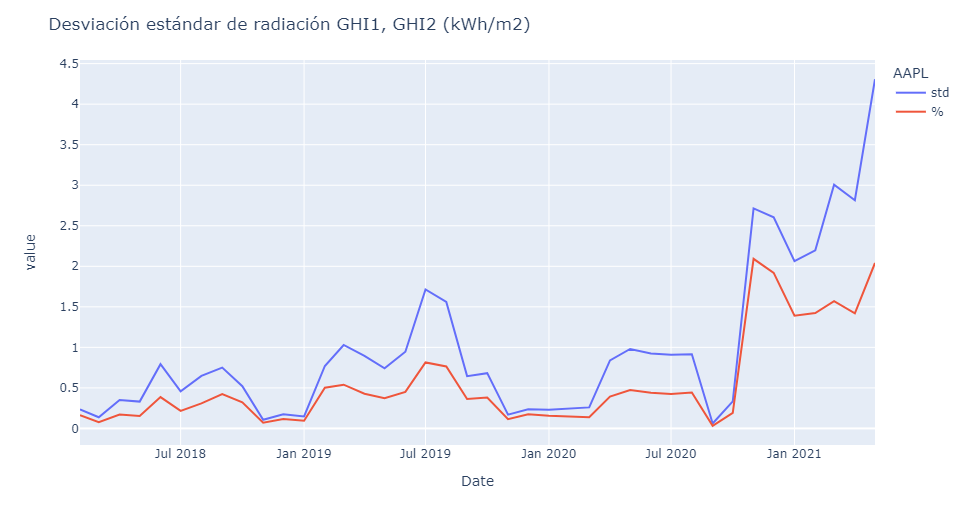

In [41]:
stdcolumns = ['std', '%']
month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]

print('Desviación estándar (std) entre ambos sensores (GHI1, GHI2) evaluada para el acumulado mensual de cada año')
print('Porcentaje desviación entre ambos sensores (GHI1, GHI2) determinado como std/media')

for j in radcolumns:
    campym.loc[(campymb['Year']==2020) & (campym['Month'] == 2),j] = np.nan
    campym.loc[(campym['Year']==2018) & (campym['Month'] == 1),j] = np.nan
    
for j in stdcolumns:
    heatmapr = campym.pivot('Month', 'Year', j)
    heatmapr.index = bn
    
    plt.figure(figsize = (16,5))
    
    ax = sns.heatmap(heatmapr, annot = True, fmt='.3')
    plt.title(j, fontsize = 20) # title with fontsize 20
    plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
    plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
    plt.show()
    
    info = {'Month': bn, '2018': campymb[campymb['Year']==2018][j], '2019': campymb[campymb['Year']==2019][j],
        '2020' :campymb[campymb['Year']==2020][j], '2021': campymb[campymb['Year']==2021][j], 'Total': sumcampymmonth[j]}
    print(j)
    print(tabulate(info, headers='keys', tablefmt='grid'))
    
print('\nstd')
print(campymb.pivot('Month', 'Year', 'std'))
print('\n%')
print(campymb.pivot('Month', 'Year', '%'))
    
# Ploteamos la std en un gráfico 

df1 = campymb.melt(id_vars=['Date'], 
                        value_vars = stdcolumns,
                        var_name='AAPL')

fig = px.line(df1, x = 'Date', y = 'value', color = 'AAPL')#,marginal_y="violin")
fig.update_layout(title='Desviación estándar de radiación GHI1, GHI2 (kWh/m2)')
fig.show()
display(Image("./img/plot9.png"))

In [35]:
excel = campymb.pivot('Month', 'Year', '%')
excel['Total'] = np.round(tempymmonth['T2m'],2)
excel.to_excel(r'./ghi1ghi2_pvgis.xlsx', index = True)

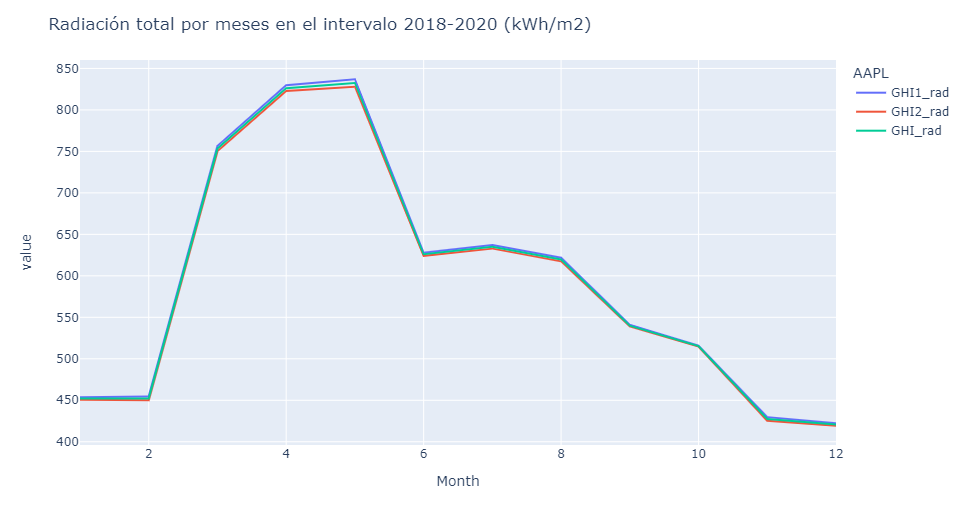

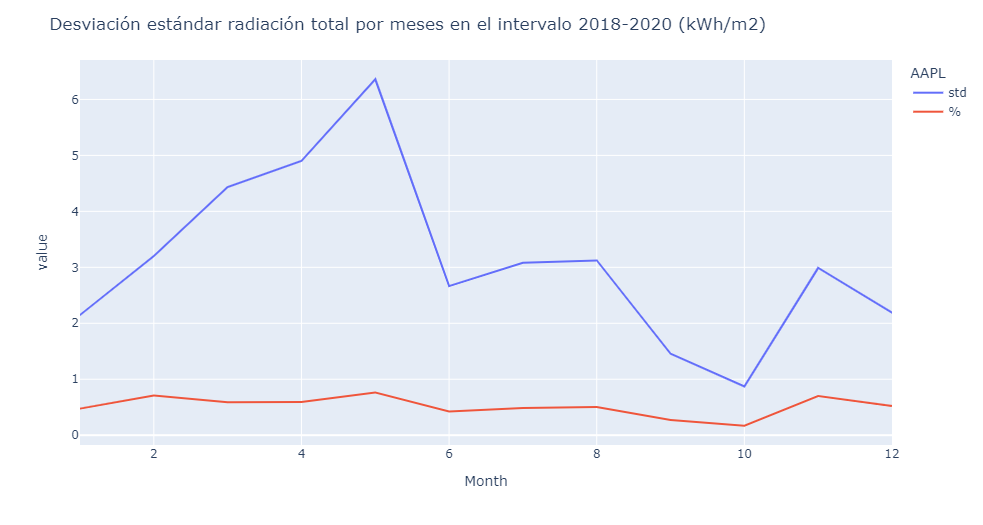

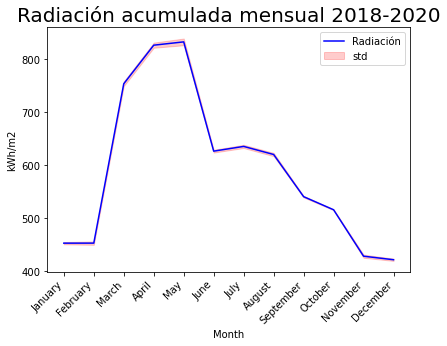

In [42]:
df1 = sumcampymmonth.melt(id_vars=['Month'], 
                        value_vars = radcolumns,
                        var_name='AAPL')


fig = px.line(df1, x = 'Month', y = 'value', color = 'AAPL' )#,marginal_y="violin")
fig.update_layout(title='Radiación total por meses en el intervalo 2018-2020 (kWh/m2)')
fig.show()
display(Image("./img/plot10.png"))

df1 = sumcampymmonth.melt(id_vars=['Month'], 
                        value_vars = stdcolumns,
                        var_name='AAPL')

sumcampymmonth['month'] = bn
fig = px.line(df1, x = 'Month', y = 'value', color = 'AAPL' )#,marginal_y="violin")
fig.update_layout(title='Desviación estándar radiación total por meses en el intervalo 2018-2020 (kWh/m2)')
fig.show()
display(Image("./img/plot11.png"))

fig, ax = plt.subplots(figsize = (6.5,4.5))
ax.plot(sumcampymmonth['month'], sumcampymmonth['GHI_rad'], '-', color = 'blue', label = 'Radiación')
ax.fill_between(sumcampymmonth['month'], sumcampymmonth['GHI_rad'] - sumcampymmonth['std'], 
                sumcampymmonth['GHI_rad'] + sumcampymmonth['std'], alpha=0.2, color = 'red', label = 'std')
ax.set_xlabel('Month')
ax.set_xticklabels(bn, rotation=45, ha='right')
ax.set_ylabel('kWh/m2') 
ax.set_title('Radiación acumulada mensual 2018-2020',fontsize = 20)
ax.legend()

# Representaciones

## Análisis univariante

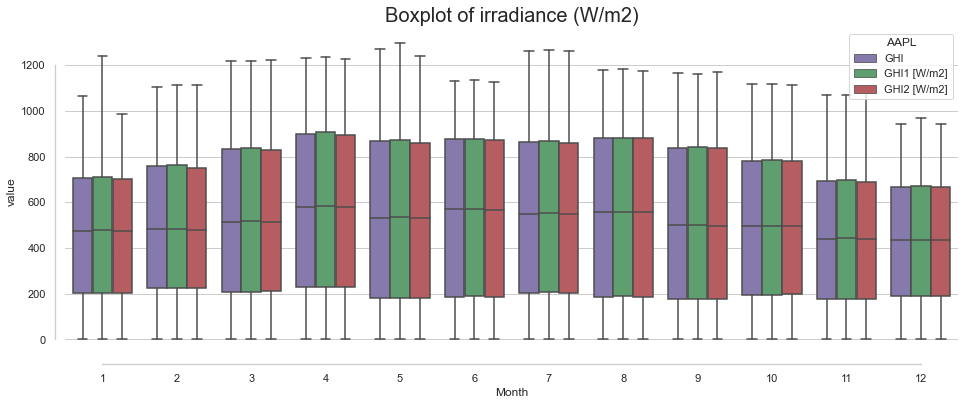

In [37]:
df1 = camp.melt(id_vars=['Month'], 
                        value_vars = ['GHI', 'GHI1 [W/m2]','GHI2 [W/m2]'],
                        var_name='AAPL')

plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
sns.boxplot(x="Month", y="value",
            hue="AAPL", palette=["m", "g", 'r'],
            data=df1)
sns.despine(offset=10, trim=True)
plt.title('Boxplot of irradiance (W/m2)', fontsize = 20);

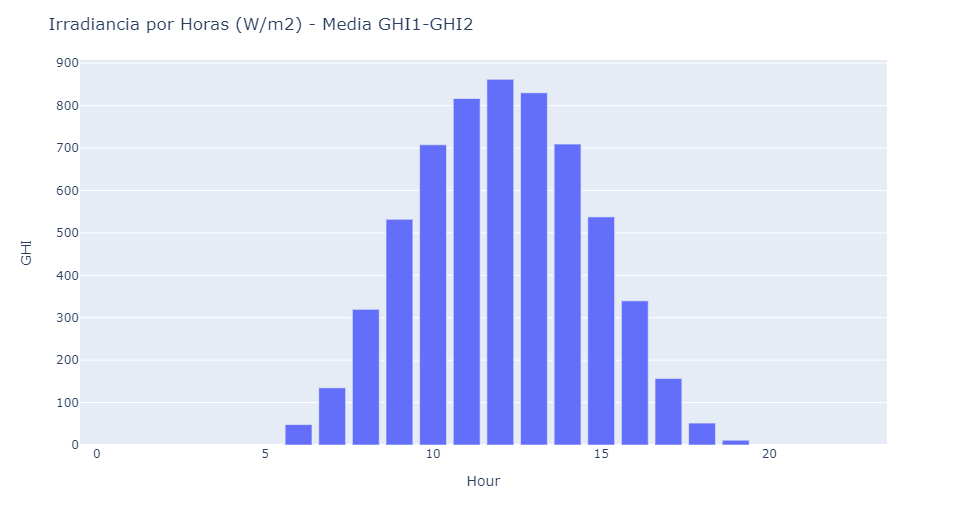

In [43]:
# creamos las medias por hora para cada GHI

fig = px.bar(camphour, x='Hour', y='GHI')
fig.update_layout(title='Irradiancia por Horas (W/m2) - Media GHI1-GHI2')
fig.show()
display(Image("./img/plot12.png"))

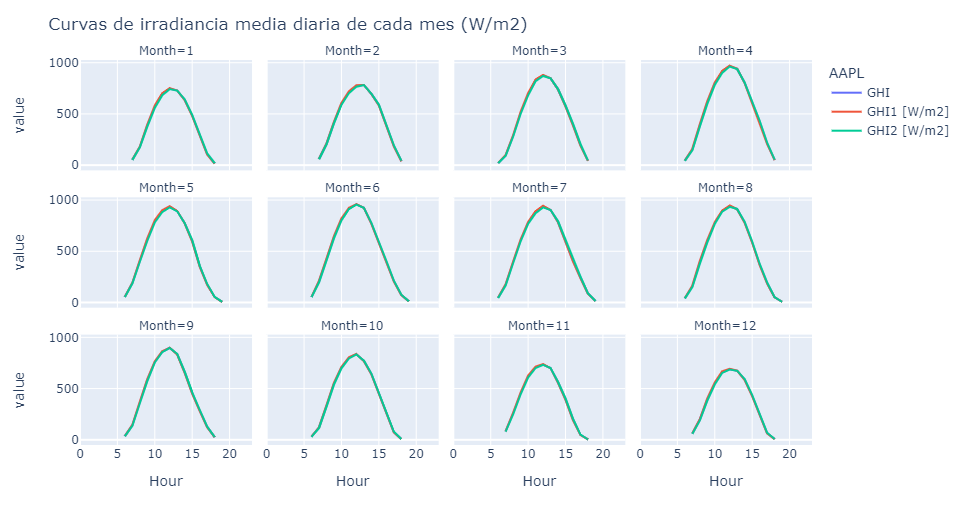

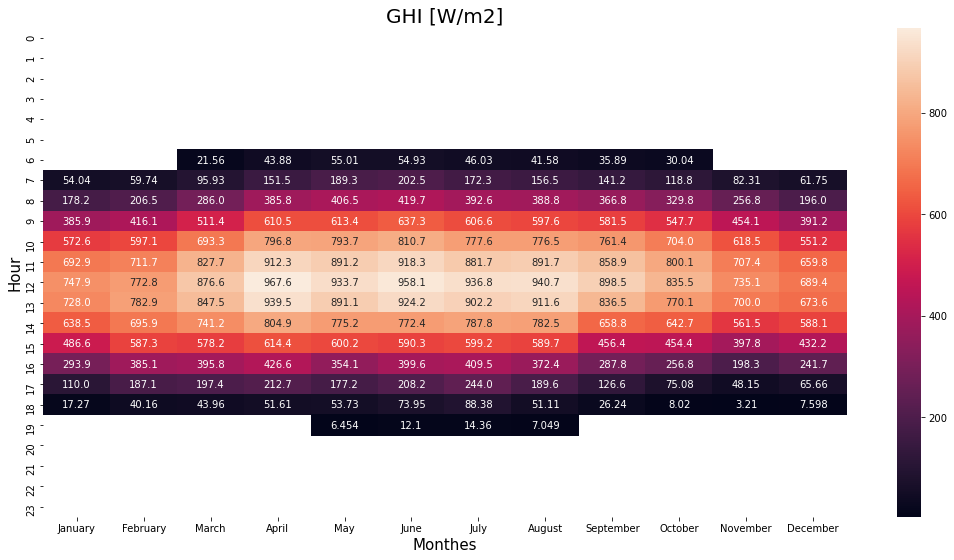

In [44]:
facet = (camp.groupby(['Month','Hour'], as_index = False).mean())
df1 = facet.melt(id_vars=['Month','Hour'], 
                        value_vars = ['GHI', 'GHI1 [W/m2]','GHI2 [W/m2]'],
                        var_name='AAPL')


fig = px.line(df1, x = 'Hour', y = 'value', color = 'AAPL', facet_col="Month", facet_col_wrap = 4)
fig.update_layout(title=('Curvas de irradiancia media diaria de cada mes (W/m2)'))
fig.show()
display(Image("./img/plot13.png"))

heatmapr = facet.pivot('Hour', 'Month', 'GHI')
heatmapr.columns = bn

plt.figure(figsize = (18,9))

ax = sns.heatmap(heatmapr, annot = True, fmt='.4')
plt.title('GHI [W/m2]', fontsize = 20) # title with fontsize 20
plt.ylabel('Hour', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

## Análisis bivariante

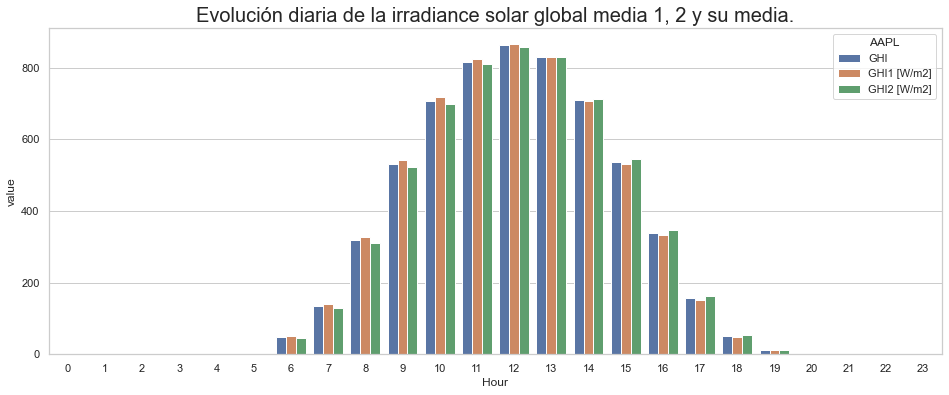

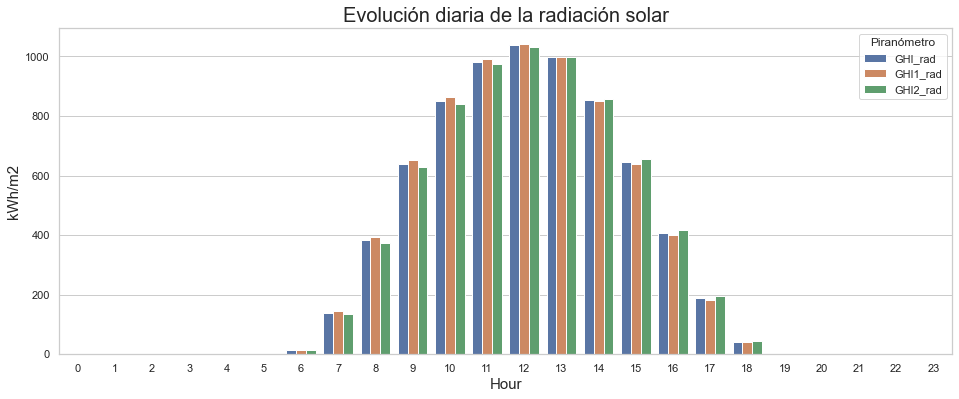

In [40]:
df1 = camphour.melt(id_vars=['Hour'], 
                        value_vars = ['GHI', 'GHI1 [W/m2]','GHI2 [W/m2]'],
                        var_name='AAPL')

plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hour", y="value", hue="AAPL", data=df1)
plt.title('Evolución diaria de la irradiance solar global media 1, 2 y su media.', fontsize = 20);

# repetimos el barplot para radiación 

df1 = camphourrad.melt(id_vars=['Hour'], 
                        value_vars = ['GHI_rad','GHI1_rad', 'GHI2_rad'],
                        var_name='Piranómetro')

plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
g = sns.barplot(x="Hour", y="value", hue="Piranómetro", data=df1)
plt.title('Evolución diaria de la radiación solar', fontsize = 20);
plt.ylabel('kWh/m2', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Hour', fontsize = 15) # y-axis label with fontsize 15
plt.show()

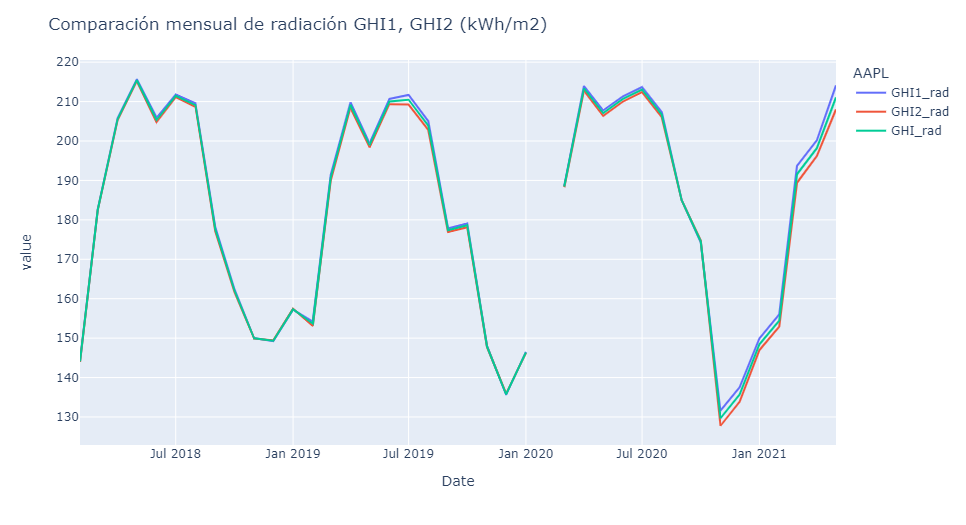

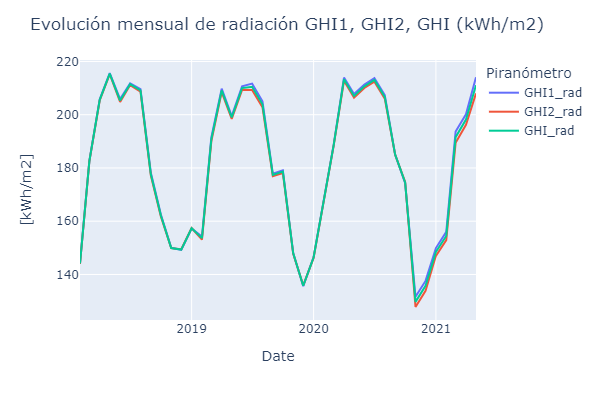

In [45]:
df1 = campym[1:].melt(id_vars=['Date'], 
                        value_vars = radcolumns,
                        var_name='AAPL')

fig = px.line(df1, x = 'Date', y = 'value', color = 'AAPL')#,marginal_y="violin")
fig.update_layout(title='Comparación mensual de radiación GHI1, GHI2 (kWh/m2)')
fig.show()
display(Image("./img/plot14.png"))

df1 = campymb.melt(id_vars=['Date'], 
                        value_vars = radcolumns,
                        var_name='Piranómetro')

fig = px.line(df1, x = 'Date', y = 'value', color = 'Piranómetro', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Evolución mensual de radiación GHI1, GHI2, GHI (kWh/m2)', xaxis_title="Date",yaxis_title="[kWh/m2]")
fig.show()
display(Image("./img/plot15.png"))

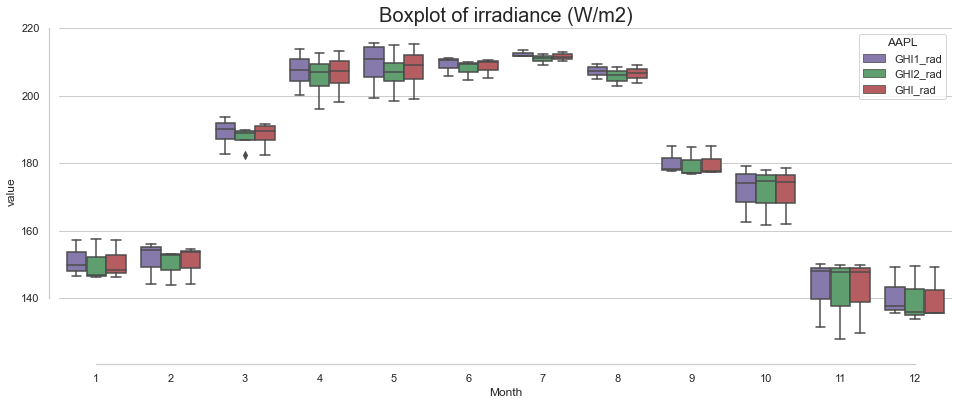

In [42]:
df1 = campymb.melt(id_vars=['Month'], 
                        value_vars = radcolumns,
                        var_name='AAPL')

plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
sns.boxplot(x="Month", y="value",
            hue="AAPL", palette=["m", "g", 'r'],
            data=df1)
sns.despine(offset=10, trim=True)
plt.title('Boxplot of irradiance (W/m2)', fontsize = 20);

<Figure size 1080x720 with 0 Axes>

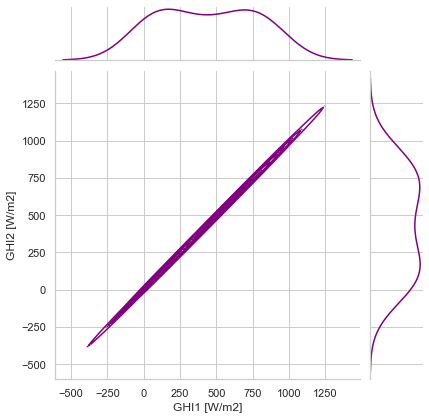

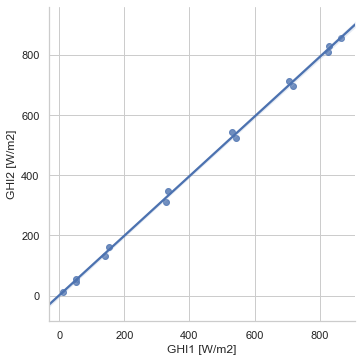

In [43]:
# análisis estadística horaria entre GH1 y GH2


plt.figure(figsize=(15,10))
sns.jointplot(
    data=camphour,
    x="GHI1 [W/m2]", y="GHI2 [W/m2]", #hue="species",
    color = 'purple',
    kind="kde",
)

g = sns.lmplot(data=camphour,
    x="GHI1 [W/m2]", y="GHI2 [W/m2]", y_jitter=.02, truncate=False)

## Análisis multivariante

In [44]:
#fig = px.scatter(camp, x="Date", y="Hour", color="GHI",
#                 title="Irradiance global - GHI [W/m2]")
#
#fig.show()
#
#fig = px.scatter(camp, x="Date", y="Hour", color='GHI1 [W/m2]',
#                 title="Irradiance global - GHI1 [W/m2]")
#
#fig.show()
#
#fig = px.scatter(camp, x="Date", y="Hour", color='GHI2 [W/m2]',
#                 title="Irradiance global - GHI2 [W/m2]")
#
#fig.show()

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

# Análisis frente a TMY

## Desviaciones

Calculamos la desviación de cada mes de cada año con respecto al de referencia 

In [45]:
excel = campymb.pivot('Month', 'Year', '%')
excel['Total'] = np.round(tempymmonth['T2m'],2)
excel.to_excel(r'./ghistd_pvgis.xlsx', index = True)

In [46]:
excel = pd.DataFrame()
excel['Month'] = info['Month']
excel['2018'] = info['2018']
excel['2019'] = info['2019']
excel['2020'] = info['2020']
excel.to_excel(r'./radstdcampo.xlsx', index = True)

In [47]:
years = campym['Year'].unique().tolist()

for j in radcolumns:
    listmony = []
    percentual = []
    for i in years[:-1]:
        m = campym[campym['Year']==i][j]
        arr = np.array([m, tmygh[:-1]])
        listmony.append(np.std(arr, axis=0))
        percentual.append((np.std(arr, axis=0)/tmygh[:-1])*100)
        
    m = campym[campym['Year']==2021][j]
    arr = np.array([m, tmygh[:5]])
    listmony.append(np.std(arr, axis=0))
    percentual.append((np.std(arr, axis=0)/tmygh[:5])*100)
    
    listmony[0][0] = np.nan
    percentual[0][0] = np.nan
    listmony[2][1] = np.nan
    percentual[2][1] = np.nan
    
    info = {'Month': bn, '2018': listmony[0], '2019': listmony[1], '2020' : listmony[2], '2021': listmony[3]}
    
    print('Desviación estándar para cada mes del año con respecto a TMY', j)
    print(tabulate(info, headers='keys', tablefmt='grid'))
    
    
    info = {'Month': bn, '2018': percentual[0], '2019': percentual[1], '2020' : percentual[2], '2021': percentual[3]}
    
    print('Desviaciones estándar para cada mes de cada año con respecto el año de referencia (en %)', j)
    print(tabulate(info, headers='keys', tablefmt='grid'))

Desviación estándar para cada mes del año con respecto a TMY GHI1_rad
+-----------+-------------+-----------+------------+---------+
| Month     |        2018 |      2019 |       2020 |    2021 |
+===========+=============+===========+============+=========+
| January   | nan         | 6.77424   |   1.40965  | 3.10505 |
+-----------+-------------+-----------+------------+---------+
| February  |   4.20872   | 0.749198  | nan        | 1.65461 |
+-----------+-------------+-----------+------------+---------+
| March     |   3.25988   | 1.12315   |   0.272374 | 2.24502 |
+-----------+-------------+-----------+------------+---------+
| April     |   3.71324   | 5.68181   |   7.77395  | 0.88308 |
+-----------+-------------+-----------+------------+---------+
| May       |   8.13122   | 0.0369429 |   4.17043  | 7.34612 |
+-----------+-------------+-----------+------------+---------+
| June      |   1.29262   | 3.68778   |   4.01491  |         |
+-----------+-------------+-----------+---------

GHI1_rad


GHI2_rad


GHI_rad


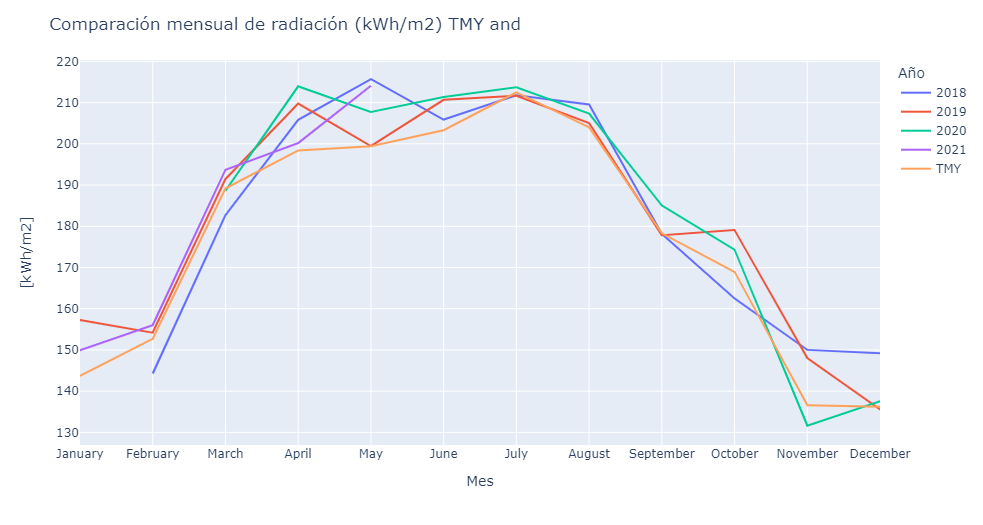

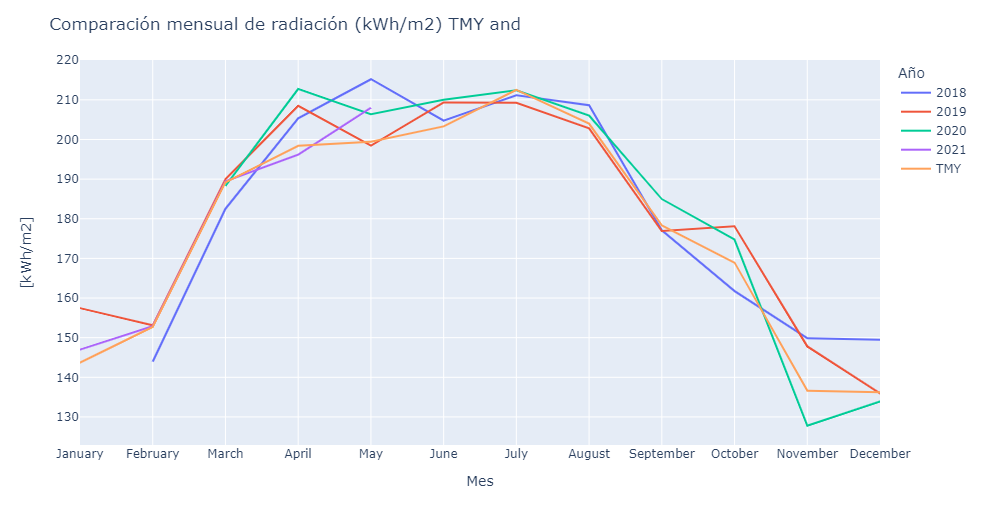

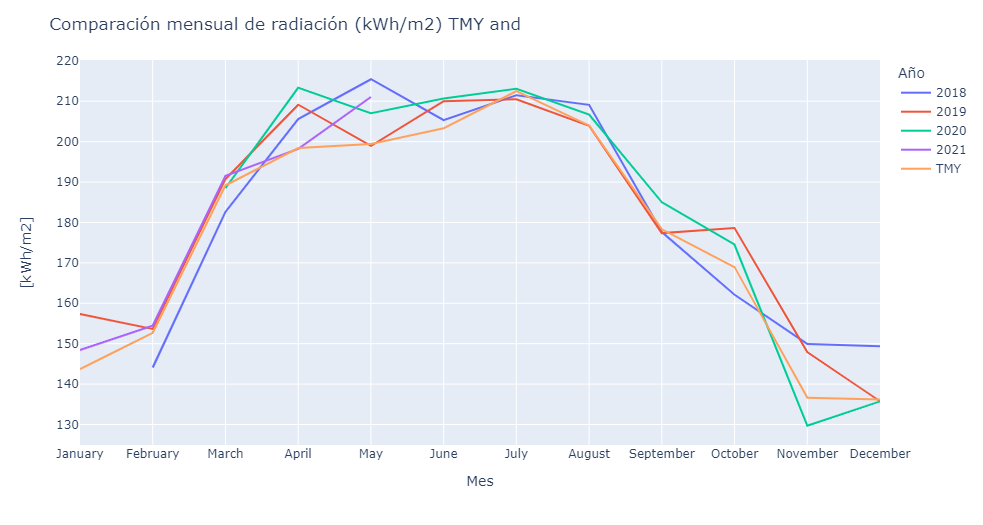

In [46]:
for i in radcolumns:
    prueba = campymb.pivot('Month', 'Year', i)
    prueba['TMY'] = tmy['GlobHor'].tolist()
    prueba['month'] = bn
    
    print(i)
    df1 = prueba.melt(id_vars=['month'], 
                            value_vars = prueba.columns[:-1],
                            var_name='Año')
    
    fig = px.line(df1, x = 'month', y = 'value', color = 'Año')#,marginal_y="violin")
    fig.update_layout(title=('Comparación mensual de radiación (kWh/m2) TMY and'), xaxis_title="Mes",yaxis_title="[kWh/m2]")
    fig.show()

display(Image("./img/plot16.png"))
display(Image("./img/plot17.png"))
display(Image("./img/plot18.png"))

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

## Temperatura

In [47]:
tempym = (camp.groupby(['Year','Month'], as_index = False).mean())

tempym['Date'] = pd.to_datetime(tempym[['Year', 'Month']].assign(DAY=1))

# creamos el promedio de todos los meses

tempymmonth = (tempym.groupby(['Month'], as_index = False).mean())

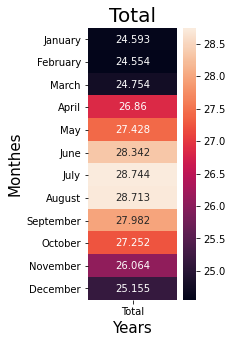

In [48]:
dfnew = pd.DataFrame()
dfnew['Total'] = tempymmonth['Temp [°C]'].tolist()
dfnew.index = bn

plt.figure(figsize = (2,5))

ax = sns.heatmap(dfnew, annot = True, fmt='.5')
plt.title('Total', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

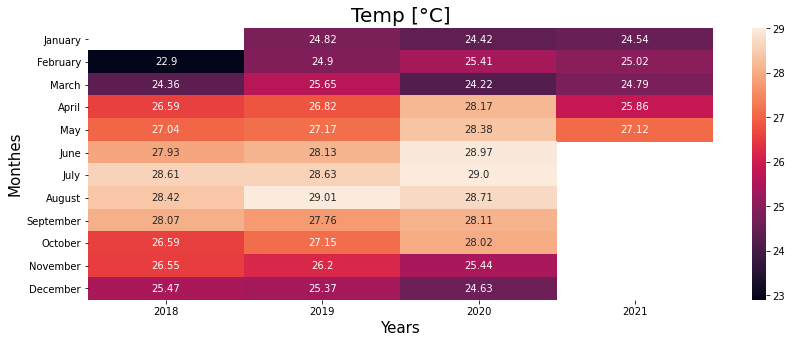

+-----------+----------+---------+---------+---------+------------+
| Month     |     2018 |    2019 |    2020 |    2021 |   Promedio |
+===========+==========+=========+=========+=========+============+
| January   | nan      | 24.8236 | 24.4192 | 24.5369 |    24.5932 |
+-----------+----------+---------+---------+---------+------------+
| February  |  22.8996 | 24.8963 | 25.4058 | 25.0162 |    24.5544 |
+-----------+----------+---------+---------+---------+------------+
| March     |  24.3589 | 25.6486 | 24.2173 | 24.793  |    24.7545 |
+-----------+----------+---------+---------+---------+------------+
| April     |  26.5943 | 26.8157 | 28.174  | 25.8556 |    26.8599 |
+-----------+----------+---------+---------+---------+------------+
| May       |  27.0447 | 27.1677 | 28.3804 | 27.1173 |    27.4275 |
+-----------+----------+---------+---------+---------+------------+
| June      |  27.9266 | 28.127  | 28.9712 |         |    28.3416 |
+-----------+----------+---------+---------+----

In [49]:

month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]

heatmapr = tempym.pivot('Month', 'Year', 'Temp [°C]')
heatmapr.index = bn

plt.figure(figsize = (14,5))

ax = sns.heatmap(heatmapr, annot = True, fmt='.4')
plt.title('Temp [°C]', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

info = {'Month': bn, '2018': tempym[tempym['Year']==2018]['Temp [°C]'], '2019': tempym[tempym['Year']==2019]['Temp [°C]'],
    '2020' :tempym[tempym['Year']==2020]['Temp [°C]'], '2021': tempym[tempym['Year']==2021]['Temp [°C]'], 
       'Promedio': tempymmonth['Temp [°C]']}

print(tabulate(info, headers='keys', tablefmt='grid'))


In [52]:
excel = tempym.pivot('Month', 'Year', 'Temp [°C]')
excel['Total'] = np.round(tempymmonth['Temp [°C]'],2)
excel.to_excel(r'./temp_campo.xlsx', index = True)

In [53]:
# creamos el promedio de todos los meses

tempymmonthstd = (tempym.groupby(['Month'], as_index = False).std())
tempymmonthstd['Temp']

0     0.000000
1     0.017857
2     0.018624
3     0.000000
4     0.000000
5     0.038490
6     0.000000
7     0.000000
8     0.019245
9     0.055873
10    0.000000
11    0.000000
Name: Temp, dtype: float64

### Representaciones

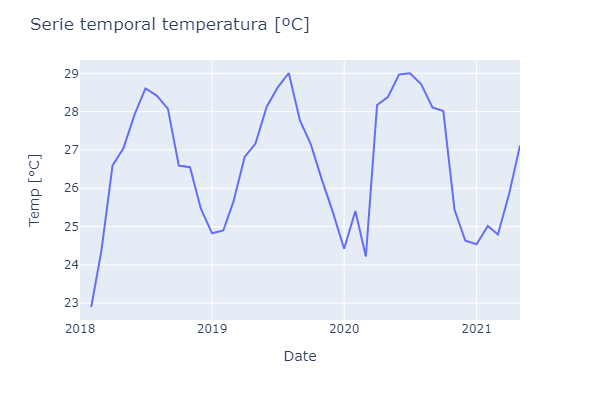

In [51]:
fig = px.line(tempym, x = 'Date', y = 'Temp [°C]', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Serie temporal temperatura [ºC]')
fig.show()
display(Image("./img/plot19.png"))

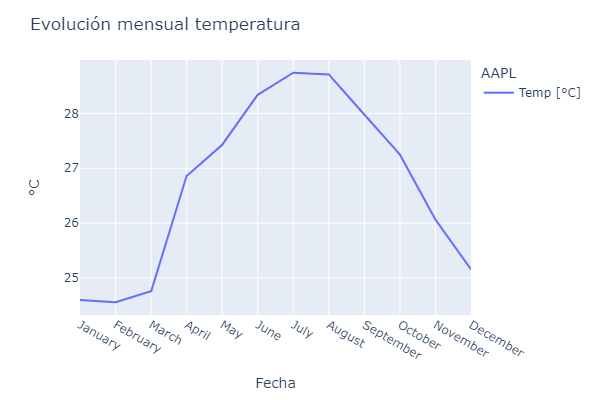

In [52]:
tempymmonth['Month'] = bn
df1 = tempymmonth.melt(id_vars=['Month'], 
                        value_vars = ['Temp [°C]'],
                        var_name='AAPL')

fig = px.line(df1, x = 'Month', y = 'value', color = 'AAPL', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title='Evolución mensual temperatura',xaxis_title="Fecha",yaxis_title="°C")
fig.show()
display(Image("./img/plot20.png"))

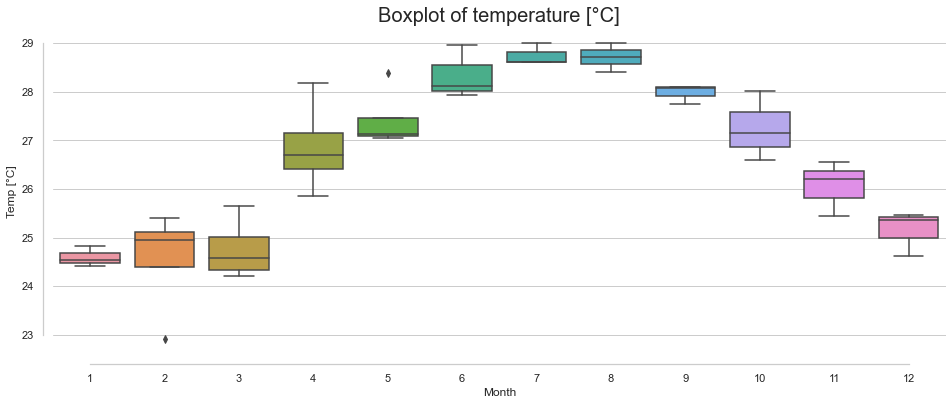

In [56]:
plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
sns.boxplot(x="Month", y='Temp [°C]',
            #hue="AAPL", palette=["m", "g", 'r'],
            data=tempym)
sns.despine(offset=10, trim=True)
plt.title('Boxplot of temperature [°C]', fontsize = 20);

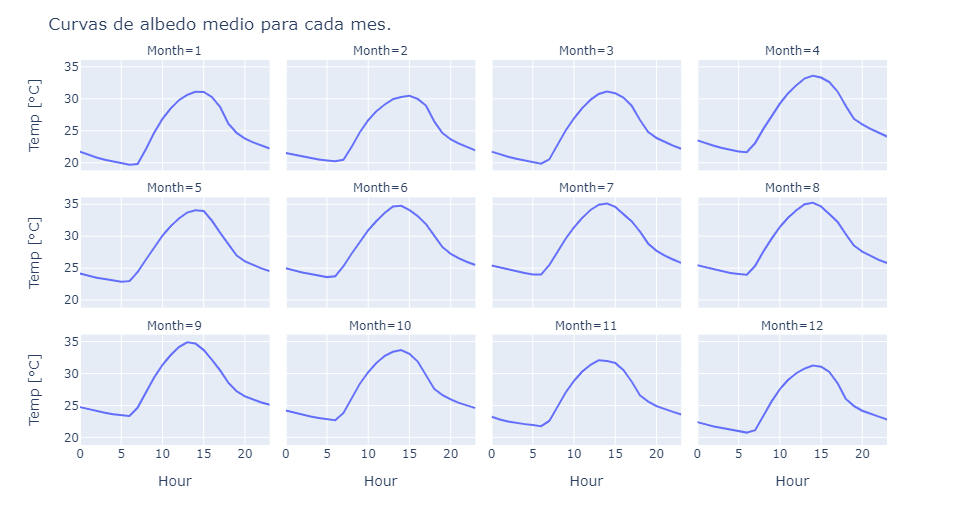

In [53]:
facet = (camp.groupby(['Month','Hour'], as_index = False).mean())

fig = px.line(facet, x = 'Hour', y = 'Temp [°C]', facet_col="Month", facet_col_wrap = 4)
fig.update_layout(title=('Curvas de albedo medio para cada mes.'))
fig.show()
display(Image("./img/plot21.png"))

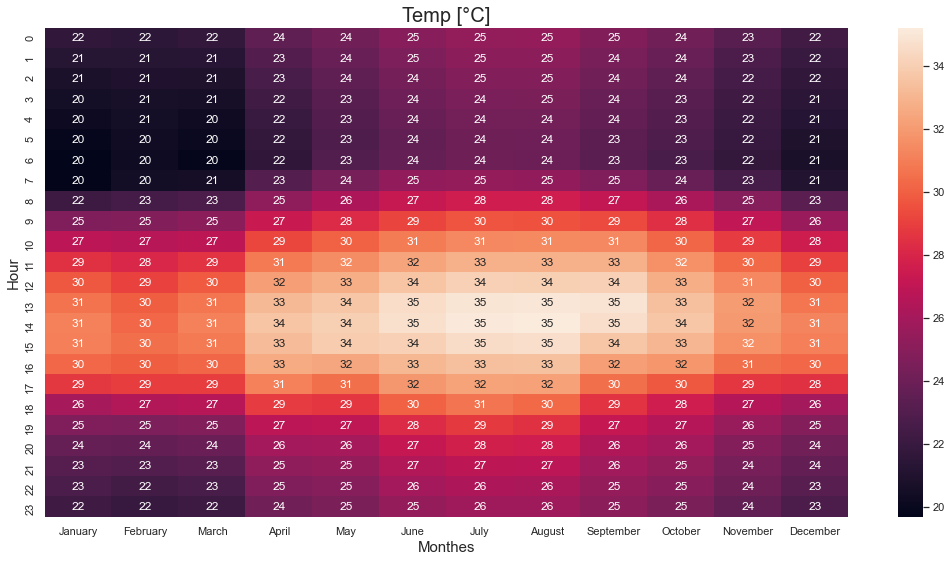

In [58]:
heatmapr = facet.pivot('Hour', 'Month', 'Temp [°C]')
heatmapr.columns = bn

plt.figure(figsize = (18,9))

ax = sns.heatmap(heatmapr, annot = True)
plt.title('Temp [°C]', fontsize = 20) # title with fontsize 20
plt.ylabel('Hour', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

In [59]:
#fig = px.scatter(camp, x="Date", y="Hour", color="Temp [°C]",
#                 title="Irradiance global - GHI [W/m2]")
#
#fig.show()


## Desviaciones

Determinamos las desviaciones con respecto TMY

In [60]:
prueba.columns[:-1]

Index([2018, 2019, 2020, 2021, 'TMY'], dtype='object', name='Year')

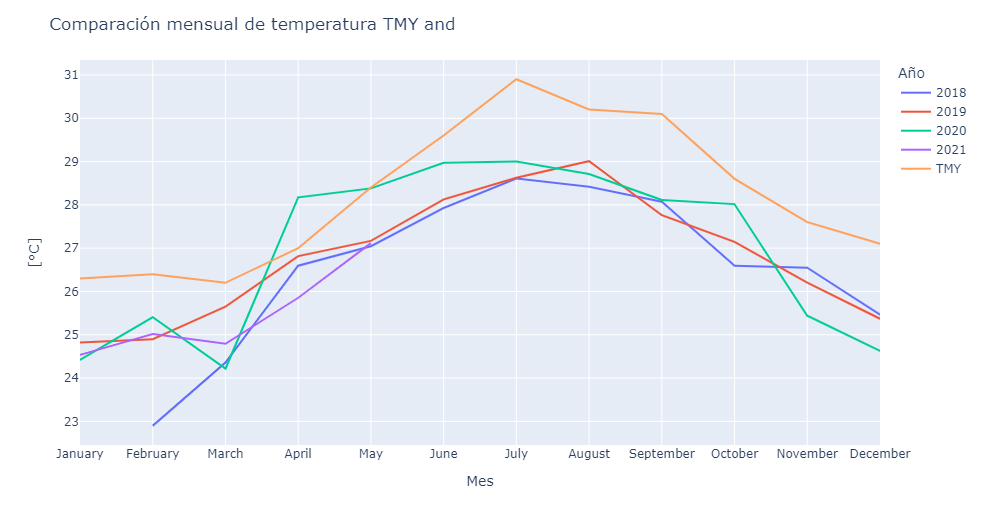

In [55]:
temp = camp.groupby(['Month', 'Year'], as_index = False).mean()
temp = temp.pivot('Month', 'Year', 'Temp [°C]')
temp['TMY'] = tmy['T_Amb'].tolist()
temp['month'] = bn

df1 = temp.melt(id_vars=['month'], 
                        value_vars = [2018, 2019, 2020, 2021, 'TMY'],
                        var_name='Año')

fig = px.line(df1, x = 'month', y = 'value', color = 'Año')#,marginal_y="violin")
fig.update_layout(title=('Comparación mensual de temperatura TMY and'), xaxis_title="Mes",yaxis_title="[°C]")
fig.show()
display(Image("./img/plot22.png"))

In [62]:
info

{'Month': ['January',
  'February',
  'March',
  'April',
  'May',
  'June',
  'July',
  'August',
  'September',
  'October',
  'November',
  'December'],
 '2018': 0           NaN
 1     22.899595
 2     24.358948
 3     26.594269
 4     27.044709
 5     27.926635
 6     28.607159
 7     28.418206
 8     28.072821
 9     26.593205
 10    26.549289
 11    25.465987
 Name: Temp [°C], dtype: float64,
 '2019': 12    24.823593
 13    24.896273
 14    25.648604
 15    26.815700
 16    27.167685
 17    28.126962
 18    28.626185
 19    29.008350
 20    27.761081
 21    27.145211
 22    26.204362
 23    25.370697
 Name: Temp [°C], dtype: float64,
 '2020': 24    24.419236
 25    25.405755
 26    24.217287
 27    28.174042
 28    28.380418
 29    28.971189
 30    28.999012
 31    28.712131
 32    28.111370
 33    28.016990
 34    25.439474
 35    24.628726
 Name: Temp [°C], dtype: float64,
 '2021': 36    24.536898
 37    25.016160
 38    24.793019
 39    25.855564
 40    27.117346
 Name: Temp [

In [63]:
excel = pd.DataFrame()
excel['Month'] = info['Month']
excel['2018'] = info['2018']
excel['2019'] = info['2019']
excel['2020'] = info['2020']
excel.to_excel(r'./tempstdcampo.xlsx', index = True)

In [64]:
years = tempym['Year'].unique().tolist()


listmony = []
percentual = []

for i in years[:-1]:
    m = tempym[tempym['Year']==i]['Temp [°C]']
    arr = np.array([m, tmyt])
    listmony.append(np.std(arr, axis=0))
    percentual.append((np.std(arr, axis=0)/tmyt)*100)
    
m = tempym[tempym['Year']==2021]['Temp [°C]']
arr = np.array([m, tmyt[:5]])
listmony.append(np.std(arr, axis=0))
percentual.append((np.std(arr, axis=0)/tmyt[:5])*100)

info = {'Month': bn, '2018': listmony[0], '2019': listmony[1], '2020' : listmony[2], '2021': listmony[3]}

print('Desviación estándar para cada mes del año con respecto a TMY Temp [°C]')
print(tabulate(info, headers='keys', tablefmt='grid'))


info = {'Month': bn, '2018': percentual[0], '2019': percentual[1], '2020' : percentual[2], '2021': percentual[3]}

print('Desviaciones estándar para cada mes de cada año con respecto el año de referencia (en %) Temp [°C]')
print(tabulate(info, headers='keys', tablefmt='grid'))



Desviación estándar para cada mes del año con respecto a TMY Temp [°C]
+-----------+------------+----------+------------+----------+
| Month     |       2018 |     2019 |       2020 |     2021 |
+===========+============+==========+============+==========+
| January   | nan        | 0.738203 | 0.940382   | 0.881551 |
+-----------+------------+----------+------------+----------+
| February  |   1.7502   | 0.751864 | 0.497122   | 0.69192  |
+-----------+------------+----------+------------+----------+
| March     |   0.920526 | 0.275698 | 0.991357   | 0.703491 |
+-----------+------------+----------+------------+----------+
| April     |   0.202866 | 0.09215  | 0.587021   | 0.572218 |
+-----------+------------+----------+------------+----------+
| May       |   0.677646 | 0.616157 | 0.00979122 | 0.641327 |
+-----------+------------+----------+------------+----------+
| June      |   0.836682 | 0.736519 | 0.314405   |          |
+-----------+------------+----------+------------+----------+

# -----------------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------------

# Albedo 

#### Consideramos los piranómetros up y down, para los que creamos el acumulado por horas. 

## Sólo tenemos datos desde 2020 a 2021


In [56]:
albedo = camp.copy()

albedo['Pyr'] = albedo['Pyr Down [W/m2]']/albedo['Pyr Up [W/m2]']
albedo['Pyr_UP_rad'] = albedo['Pyr Up [W/m2]']*10/60/1000
albedo['Pyr_DOWN_rad'] = albedo['Pyr Down [W/m2]']*10/60/1000
albedo['Pyr'] = albedo['Pyr Down [W/m2]']/albedo['Pyr_UP_rad']
# calculamos el albedo acumulado por horas

albedohour = (albedo[1:].groupby(['Hour'], as_index = False).mean())
albedohourrad = (albedo[1:].groupby(['Hour'], as_index = False).sum())
albedohourrad['Pyr_UP_rad'] = camphourrad['Pyr Up [W/m2]']*10/60/1000
albedohourrad['Pyr_DOWN_rad'] = camphourrad['Pyr Down [W/m2]']*10/60/1000

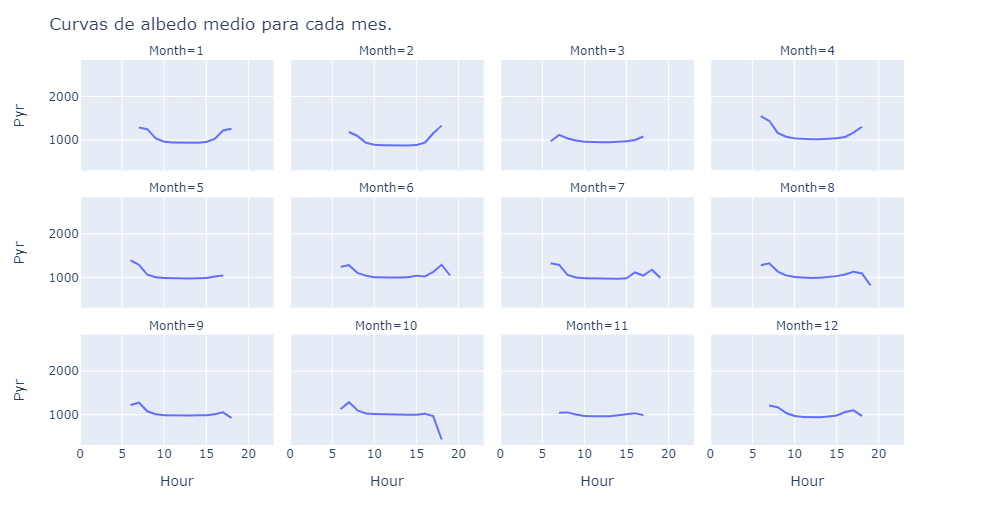

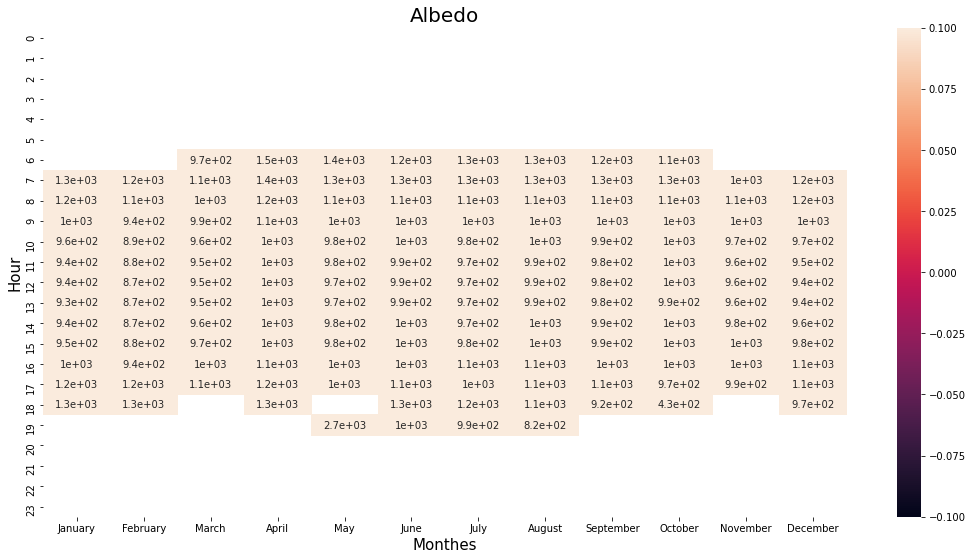

In [58]:
facet = (albedo.groupby(['Month','Hour'], as_index = False).mean())

fig = px.line(facet, x = 'Hour', y = 'Pyr', facet_col="Month", facet_col_wrap = 4)
fig.update_layout(title=('Curvas de albedo medio para cada mes.'))
fig.show()
display(Image("./img/plot23.png"))

heatmapr = facet.pivot('Hour', 'Month', 'Pyr')
heatmapr.columns = bn

plt.figure(figsize = (18,9))

ax = sns.heatmap(heatmapr, annot = True)
plt.title('Albedo', fontsize = 20) # title with fontsize 20
plt.ylabel('Hour', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

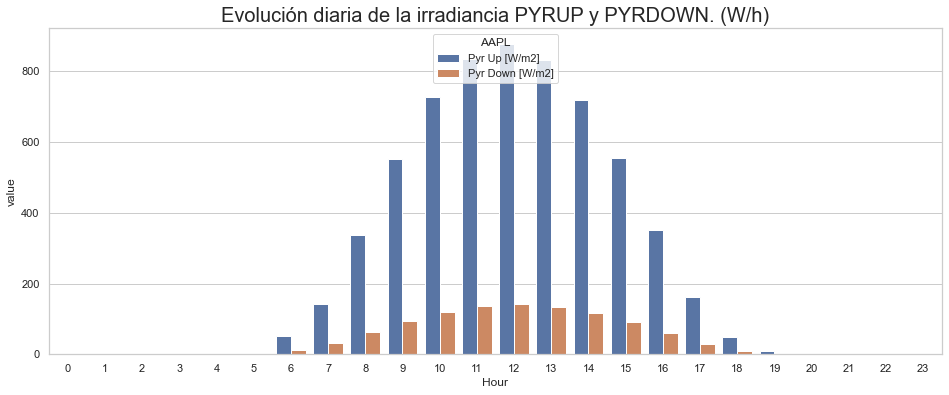

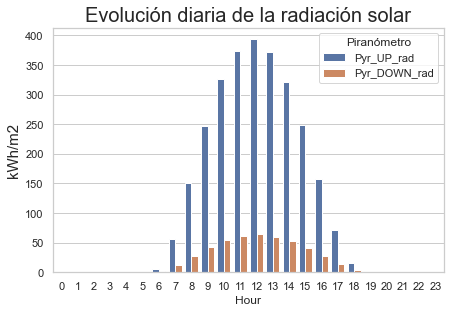

In [67]:
df1 = albedohour.melt(id_vars=['Hour'], 
                        value_vars = ['Pyr Up [W/m2]','Pyr Down [W/m2]'],
                        var_name='AAPL')

plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hour", y="value", hue="AAPL", data=df1)
plt.title('Evolución diaria de la irradiancia PYRUP y PYRDOWN. (W/h)', fontsize = 20);

df1 = albedohourrad.melt(id_vars=['Hour'], 
                        value_vars = ['Pyr_UP_rad','Pyr_DOWN_rad'],
                        var_name='Piranómetro')

plt.figure(figsize = (7,4.5))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hour", y="value", hue="Piranómetro", data=df1)
plt.ylabel('kWh/m2', fontsize = 15) # y-axis label with fontsize 15
plt.title('Evolución diaria de la radiación solar', fontsize = 20);

Realizamos el filtrado para el albedo:

A) Consideramos +-2h mediodía 

B) Consideramos irradiancias mayor de 700 W/m2

lo calculamos como la suma del pyr up dividido el pyr down. 

### A)

In [60]:
opta = albedohourrad.copy()
opta['Pyr'] = opta['Pyr_DOWN_rad']/opta['Pyr_UP_rad']

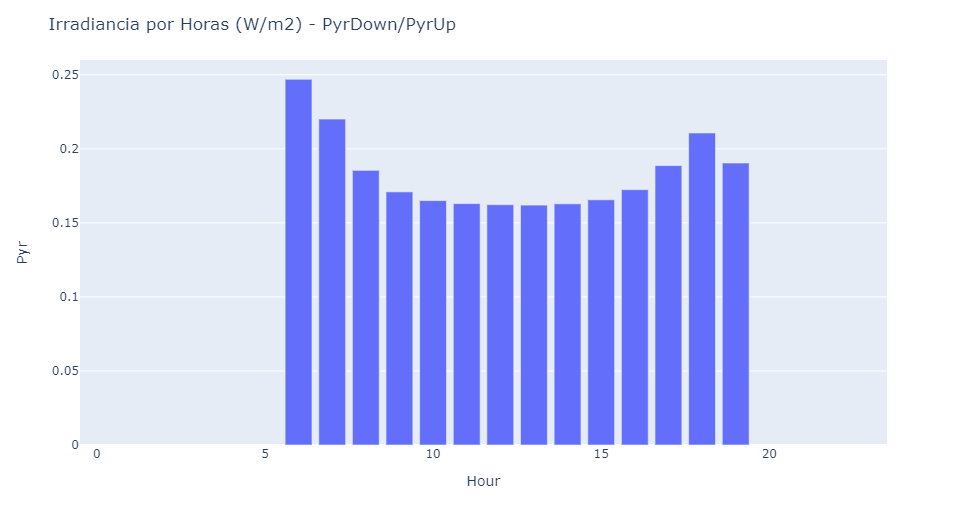

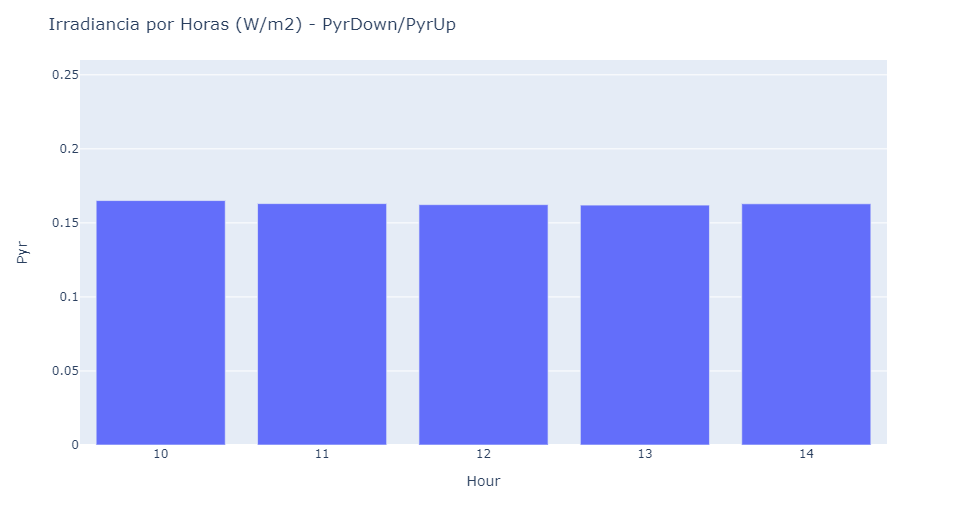

In [61]:
fig = px.bar(opta, x='Hour', y='Pyr')
fig.update_layout(title='Irradiancia por Horas (W/m2) - PyrDown/PyrUp')#, yaxis_range=[5,7])
fig.show()
display(Image("./img/plot24.png"))

fig = px.bar(opta, x='Hour', y='Pyr')
fig.update_layout(title='Irradiancia por Horas (W/m2) - PyrDown/PyrUp', xaxis_range=[9.5,14.5])
fig.show()
display(Image("./img/plot25.png"))

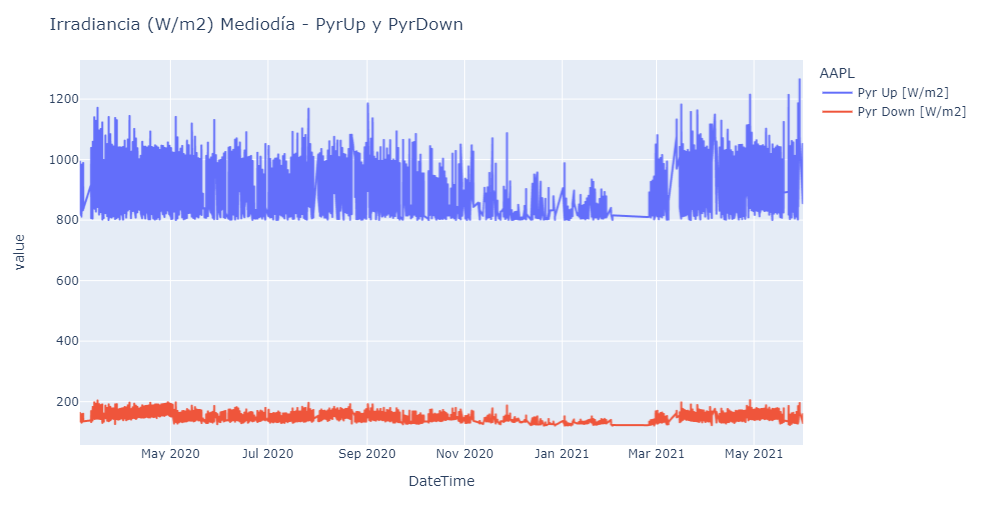

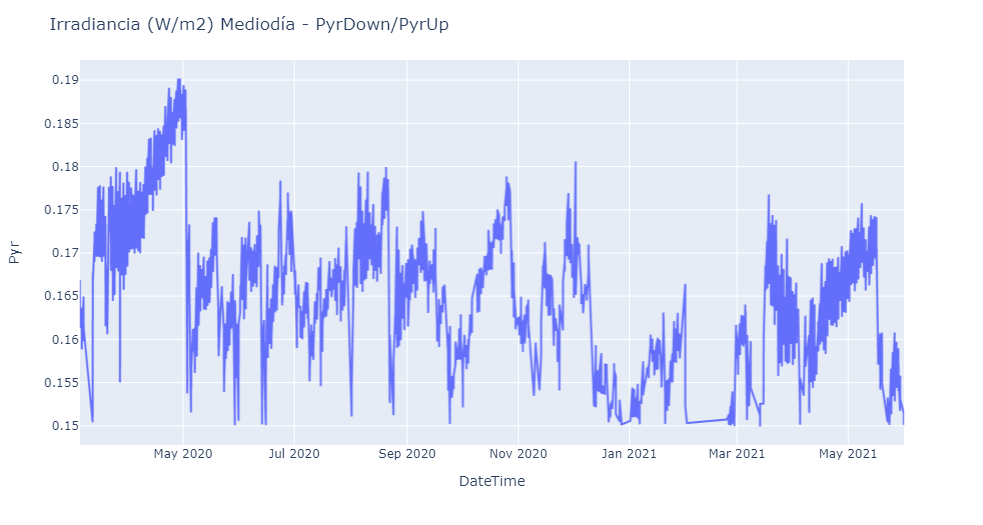

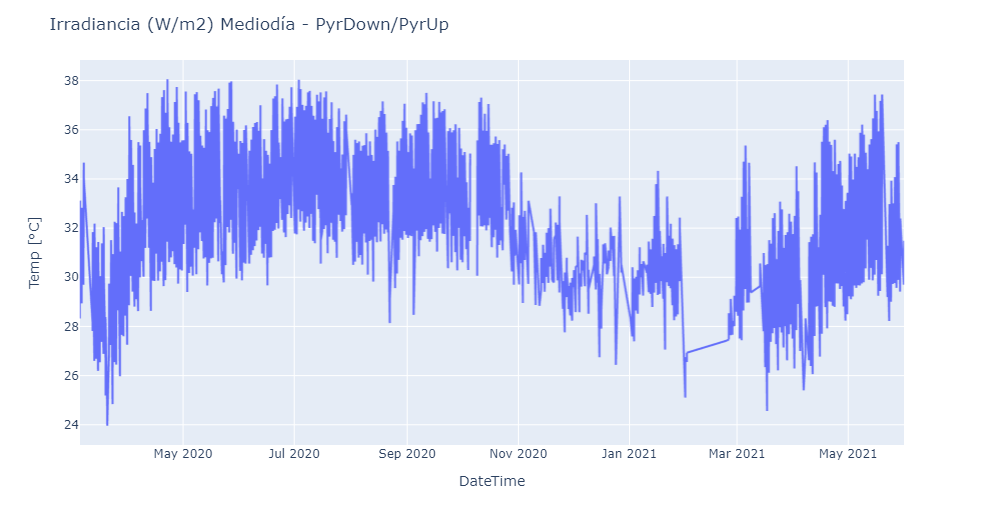

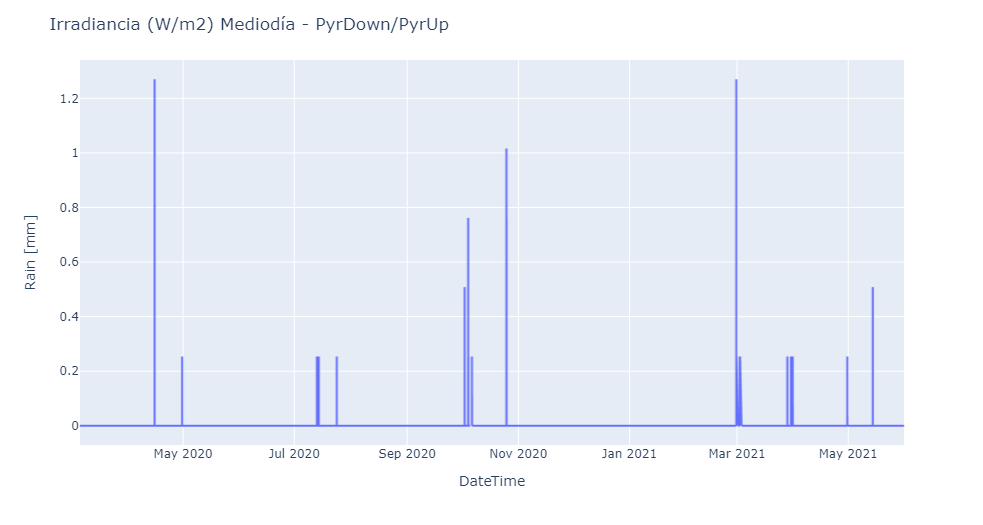

In [63]:
albmediodia = albedo[(albedo['Hour'] == 10) | (albedo['Hour'] == 11) | (albedo['Hour'] == 12) | (albedo['Hour'] == 13) | (albedo['Hour'] == 14)].copy()
albmediodia['Pyr'] = albmediodia['Pyr Down [W/m2]']/albmediodia['Pyr Up [W/m2]']
albmediodia = albmediodia[albmediodia['Pyr Up [W/m2]'] > 800]
albmediodia = albmediodia[albmediodia['Pyr'] > 0.15]
albmedna = albmediodia.dropna(subset=['Pyr'])

df1 = albmedna.melt(id_vars=['DateTime'], 
                        value_vars = ['Pyr Up [W/m2]','Pyr Down [W/m2]'],
                        var_name='AAPL')

fig = px.line(df1, x = 'DateTime', y = 'value', color = 'AAPL')#,marginal_y="violin")
fig.update_layout(title=('Irradiancia (W/m2) Mediodía - PyrUp y PyrDown'))
fig.show()
display(Image("./img/plot26.png"))

fig = px.line(albmedna, x = 'DateTime', y = 'Pyr')#,marginal_y="violin")
fig.update_layout(title=('Irradiancia (W/m2) Mediodía - PyrDown/PyrUp'))
fig.show()
display(Image("./img/plot27.png"))

fig = px.line(albmedna, x = 'DateTime', y = 'Temp [°C]')#,marginal_y="violin")
fig.update_layout(title=('Irradiancia (W/m2) Mediodía - PyrDown/PyrUp'))
fig.show()
display(Image("./img/plot28.png"))

fig = px.line(albmedna, x = 'DateTime', y = 'Rain [mm]')#,marginal_y="violin")
fig.update_layout(title=('Irradiancia (W/m2) Mediodía - PyrDown/PyrUp'))
fig.show()
display(Image("./img/plot29.png"))

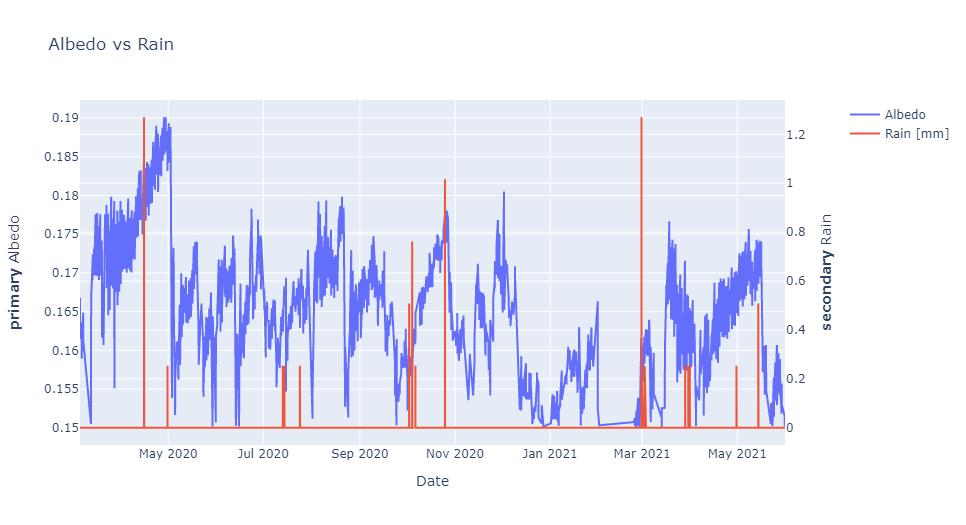

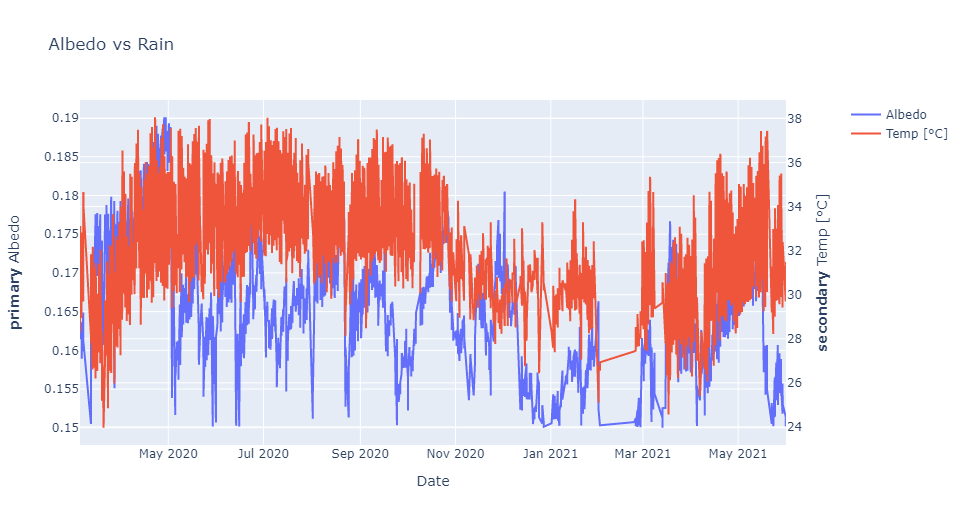

In [64]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x = albmedna['DateTime'], y = albmedna['Pyr'], name="Albedo"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x = albmedna['DateTime'], y = albmedna['Rain [mm]'], name="Rain [mm]"),
    secondary_y=True,
)
# Add figure title
fig.update_layout(
    title_text="Albedo vs Rain"
)
# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="<b>primary</b> Albedo", secondary_y=False)
fig.update_yaxes(title_text="<b>secondary</b> Rain", secondary_y=True)
fig.show()
display(Image("./img/plot30.png"))

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x = albmedna['DateTime'], y = albmedna['Pyr'], name="Albedo"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x = albmedna['DateTime'], y = albmedna['Temp [°C]'], name="Temp [°C]"),
    secondary_y=True,
)
# Add figure title
fig.update_layout(
    title_text="Albedo vs Rain"
)
# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="<b>primary</b> Albedo", secondary_y=False)
fig.update_yaxes(title_text="<b>secondary</b> Temp [°C]", secondary_y=True)
fig.show()
display(Image("./img/plot31.png"))

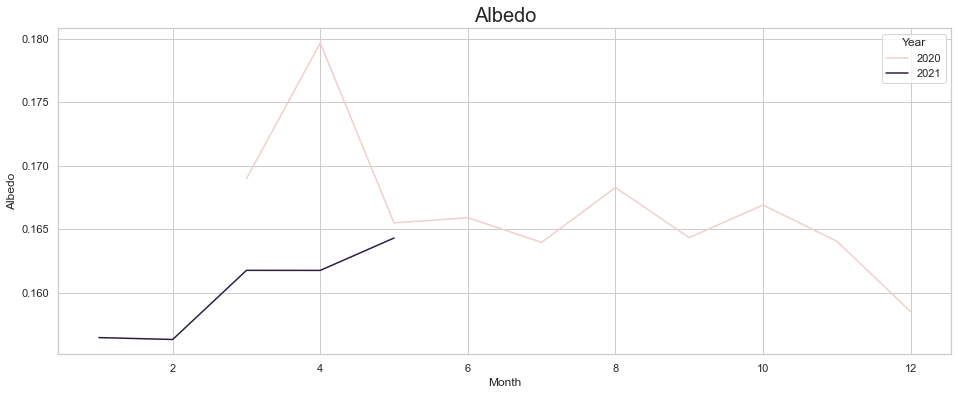

In [72]:
optq = albmedna.groupby(['Month', 'Year'], as_index = False).sum()
optq['Pyr'] = optq['Pyr Down [W/m2]']/optq['Pyr Up [W/m2]']
optq.pivot('Month', 'Year', 'Pyr')


plt.figure(figsize = (16,6))
sns.set_theme(style="whitegrid")
sns.lineplot(x="Month", y="Pyr", hue="Year", data=optq)
#plt.ylim(5, 7)
plt.ylabel('Albedo')
plt.title('Albedo', fontsize = 20);

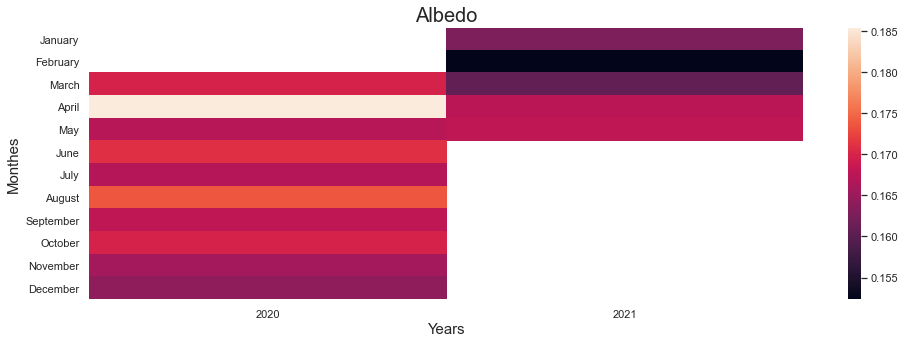

+-----------+------------+----------+----------+
| Month     |       2020 |     2021 |    Total |
+===========+============+==========+==========+
| January   | nan        | 0.162846 | 0.162846 |
+-----------+------------+----------+----------+
| February  | nan        | 0.152355 | 0.152355 |
+-----------+------------+----------+----------+
| March     |   0.169808 | 0.160733 | 0.164867 |
+-----------+------------+----------+----------+
| April     |   0.185408 | 0.167583 | 0.176791 |
+-----------+------------+----------+----------+
| May       |   0.167215 | 0.167962 | 0.167594 |
+-----------+------------+----------+----------+
| June      |   0.171054 |          | 0.171054 |
+-----------+------------+----------+----------+
| July      |   0.167174 |          | 0.167174 |
+-----------+------------+----------+----------+
| August    |   0.173782 |          | 0.173782 |
+-----------+------------+----------+----------+
| September |   0.167862 |          | 0.167862 |
+-----------+-------

In [73]:
albedopym = (camp.groupby(['Year','Month'], as_index = False).sum())
# creamos columna año mes 
albedopym['Date'] = pd.to_datetime(albedopym[['Year', 'Month']].assign(DAY=1))
albedopym['Albedo'] = albedopym['Pyr Down [W/m2]']/albedopym['Pyr Up [W/m2]']

# creamos el sumatorio para calcular el total de radiación/irradiancia de todos los meses
sumalbedopymmonth = (albedopym.groupby(['Month'], as_index = False).sum())
sumalbedopymmonth['Albedo'] = sumalbedopymmonth['Pyr Down [W/m2]']/sumalbedopymmonth['Pyr Up [W/m2]']

month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]


heatmapr = albedopym.pivot('Month', 'Year', 'Albedo').drop(columns=[2018, 2019])
plt.figure(figsize = (16,5))
heatmapr.index = bn

ax = sns.heatmap(heatmapr)
plt.title('Albedo', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

info = {'Month': bn, 
    '2020' :albedopym[albedopym['Year']==2020]['Albedo'], '2021': albedopym[albedopym['Year']==2021]['Albedo'], 'Total': sumalbedopymmonth['Albedo']}

print(tabulate(info, headers='keys', tablefmt='grid'))


#### Repetimos quedándonos con las horas centrales 

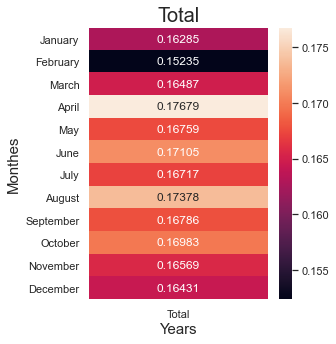

In [74]:
dfnew = pd.DataFrame()
dfnew['Total'] = sumalbedopymmonth['Albedo'].tolist()
dfnew.index = bn

plt.figure(figsize = (4,5))

ax = sns.heatmap(dfnew, annot = True, fmt='.5')
plt.title('Total', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

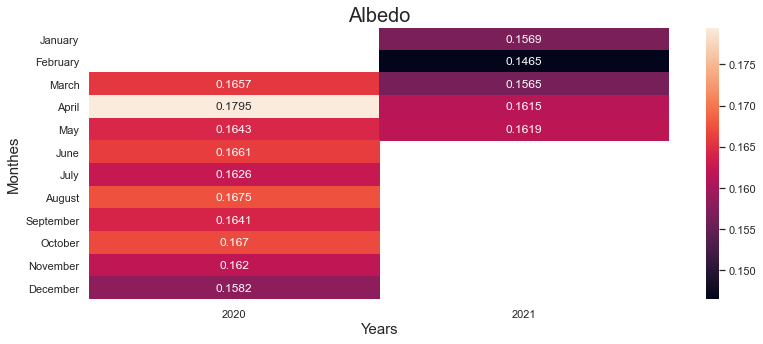

+-----------+------------+----------+------------+
| Month     |       2020 |     2021 |   Promedio |
+===========+============+==========+============+
| January   | nan        | 0.156864 |   0.156864 |
+-----------+------------+----------+------------+
| February  | nan        | 0.146479 |   0.146479 |
+-----------+------------+----------+------------+
| March     |   0.165746 | 0.156484 |   0.16065  |
+-----------+------------+----------+------------+
| April     |   0.179468 | 0.161475 |   0.170774 |
+-----------+------------+----------+------------+
| May       |   0.164276 | 0.161868 |   0.163052 |
+-----------+------------+----------+------------+
| June      |   0.166098 |          |   0.166098 |
+-----------+------------+----------+------------+
| July      |   0.16264  |          |   0.16264  |
+-----------+------------+----------+------------+
| August    |   0.167509 |          |   0.167509 |
+-----------+------------+----------+------------+
| September |   0.164075 |     

In [75]:
albmediodia = camp[(camp['Hour'] == 10) | (camp['Hour'] == 11) | (camp['Hour'] == 12) | (camp['Hour'] == 13) | (camp['Hour'] == 14)].copy()

albedopym = (albmediodia.groupby(['Year','Month'], as_index = False).sum())
# creamos columna año mes 
albedopym['Date'] = pd.to_datetime(albedopym[['Year', 'Month']].assign(DAY=1))
albedopym['Albedo'] = albedopym['Pyr Down [W/m2]']/albedopym['Pyr Up [W/m2]']

# creamos el sumatorio para calcular el total de radiación/irradiancia de todos los meses
sumalbedopymmonth = (albedopym.groupby(['Month'], as_index = False).sum())
sumalbedopymmonth['Albedo'] = sumalbedopymmonth['Pyr Down [W/m2]']/sumalbedopymmonth['Pyr Up [W/m2]']

month_value = [1,2,3,4,5,6,7,8,9,10,11,12]  
bn = [calendar.month_name[i] for i in month_value]


heatmapr = albedopym.pivot('Month', 'Year', 'Albedo').drop(columns=[2018, 2019])
heatmapr.index = bn

plt.figure(figsize = (13,5))

ax = sns.heatmap(heatmapr, annot = True, fmt='.4')
plt.title('Albedo', fontsize = 20) # title with fontsize 20
plt.xlabel('Years', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('Monthes', fontsize = 15) # y-axis label with fontsize 15
plt.show()

info = {'Month': bn, 
    '2020' :albedopym[albedopym['Year']==2020]['Albedo'], '2021': albedopym[albedopym['Year']==2021]['Albedo'], 'Promedio': sumalbedopymmonth['Albedo']}

print(tabulate(info, headers='keys', tablefmt='grid'))


In [76]:
excel = albedopym.pivot('Month', 'Year', 'Albedo').drop(columns=[2018, 2019])
excel['Total'] = sumalbedopymmonth['Albedo']
excel.to_excel(r'./tablealbedo.xlsx', index = True)

In [77]:
sumalbedopymmonth['Month']=bn
fig = px.line(sumalbedopymmonth, x = 'Month', y = 'Albedo', width=600, height=400)#,marginal_y="violin")
fig.update_layout(title=('Albedo - PyrDown/PyrUp'))
fig.show()
display(Image("./img/plot32.png"))

# ----------------------------------------------------------------------------

# ----------------------------------------------------------------------------

# ----------------------------------------------------------------------------


## Desviación 2018-2021 frente a timesries y tmy

Determinamos el máximo y el mínimo para cada mes del timeseries

### Radiancia

In [78]:
maxim =[]
minim = []
std = []
meanm = []

for i in range(1,13,1):
    maxim.append(dfpym.loc[dfpym['Month'] == i, 'G_rad'].max())
    minim.append(dfpym.loc[dfpym['Month'] == i, 'G_rad'].min())
    meanm.append(dfpym.loc[dfpym['Month'] == i, 'G_rad'].mean())
    std.append(dfpym.loc[dfpym['Month'] == i, 'G_rad'].std())
    
prueba = campymb.pivot('Month', 'Year', 'GHI_rad')
prueba['TMY'] = tmy['GlobHor'].tolist()
prueba['month'] = bn
prueba['max'] = maxim
prueba['min'] = minim
prueba['std'] = std
prueba['mean'] = meanm

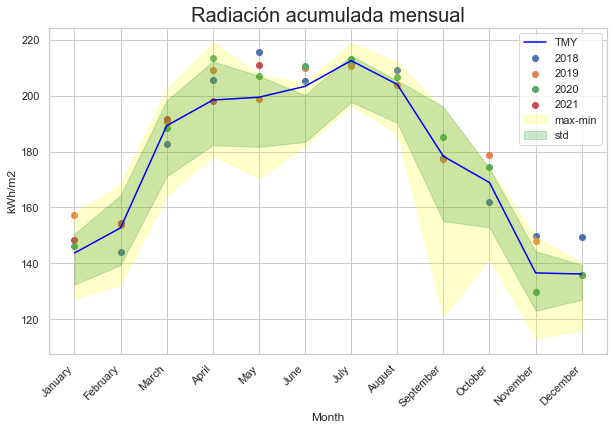

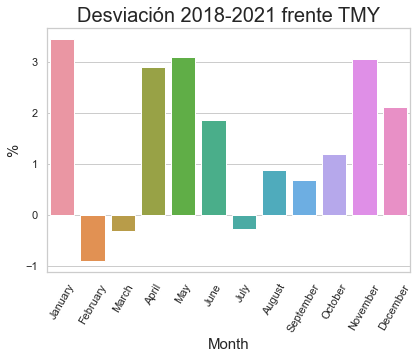

In [79]:
year = [2018, 2019, 2020, 2021, 'TMY']


fig, ax = plt.subplots(figsize = (10,6))
ax.plot(prueba['month'], prueba['TMY'], '-', color = 'blue', label = 'TMY')
ax.scatter(prueba['month'], prueba[2018],  label = '2018')
ax.scatter(prueba['month'], prueba[2019], label = '2019')
ax.scatter(prueba['month'], prueba[2020], label = '2020')
ax.scatter(prueba['month'], prueba[2021], label = '2021')
ax.fill_between(prueba['month'], prueba['max'], 
                prueba['min'], alpha=0.2, color = 'yellow', label = 'max-min')
ax.fill_between(prueba['month'], prueba['mean'] + prueba['std'], 
                prueba['mean'] - prueba['std'], alpha=0.2, color = 'green', label = 'std')
ax.set_xlabel('Month')
ax.set_xticklabels(bn, rotation=45, ha='right')
ax.set_ylabel('kWh/m2') 
ax.set_title('Radiación acumulada mensual',fontsize = 20)
ax.legend()

meanmonth = (campymb.groupby(['Month'], as_index = False).mean())
dfnew = pd.DataFrame()
dfnew['Total'] = meanmonth['GHI_rad'].tolist()
dfnew.index = bn
dfnew['TMY'] = tmy['GlobHor'].tolist()
# realizamos cálculo de desviacón estándar entre datos de campos y tmy para el acumulado mensual de cada mes
#dfnew['std'] = (-(1-dfnew['Total']/dfnew['TMY'])*100)
#dfnew['%'] = (dfnew['std']/dfnew['TMY'])*100
col = dfnew.loc[:, ['Total', 'TMY']]
dfnew['%'] = (col.std(axis=1)/dfnew['TMY'])*100 
#le introducimos el signo manualmente
dfnew['std(%)'] = dfnew['%']
dfnew['std(%)'][1] = -dfnew['std(%)'][1]
dfnew['std(%)'][2] = -dfnew['std(%)'][2]
dfnew['std(%)'][6] = -dfnew['std(%)'][6]

plt.figure(figsize = (6.5,4.5))
sns.set_theme(style="whitegrid")
g = sns.barplot(x=dfnew.index, y= 'std(%)', data=dfnew)
plt.title('Desviación 2018-2021 frente TMY', fontsize = 20);
plt.ylabel('%', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Month', fontsize = 15) # y-axis label with fontsize 15
plt.xticks(rotation=60)
plt.show()

### Temperatura

In [80]:
tempym = (df.groupby(['Year','Month'], as_index = False).mean())
tempym['Date'] = pd.to_datetime(tempym[['Year', 'Month']].assign(DAY=1))
tempym2 = (camp.groupby(['Year','Month'], as_index = False).mean())
tempym2['Date'] = pd.to_datetime(tempym2[['Year', 'Month']].assign(DAY=1))
tempymmonth = (tempym2.groupby(['Month'], as_index = False).mean())

In [81]:
maxim =[]
minim = []
std = []
meanm = []

for i in range(1,13,1):
    maxim.append(tempym.loc[tempym['Month'] == i, 'T2m'].max())
    minim.append(tempym.loc[tempym['Month'] == i, 'T2m'].min())
    meanm.append(tempym.loc[tempym['Month'] == i, 'T2m'].mean())
    std.append(tempym.loc[tempym['Month'] == i, 'T2m'].std())
    
prueba = tempym2.pivot('Month', 'Year', 'Temp [°C]')
prueba['TMY'] = tmy['T_Amb'].tolist()
prueba['month'] = bn
prueba['max'] = maxim
prueba['min'] = minim
prueba['std'] = std
prueba['mean'] = meanm

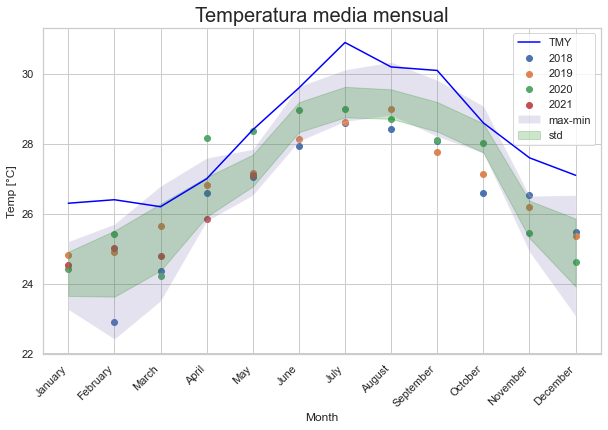

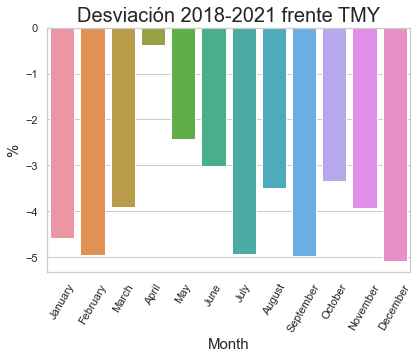

In [82]:
year = [2018, 2019, 2020, 2021, 'TMY']


fig, ax = plt.subplots(figsize = (10,6))
ax.plot(prueba['month'], prueba['TMY'], '-', color = 'blue', label = 'TMY')
ax.scatter(prueba['month'], prueba[2018],  label = '2018')
ax.scatter(prueba['month'], prueba[2019], label = '2019')
ax.scatter(prueba['month'], prueba[2020], label = '2020')
ax.scatter(prueba['month'], prueba[2021], label = '2021')
ax.fill_between(prueba['month'], prueba['max'], 
                prueba['min'], alpha=0.2, label = 'max-min')
ax.fill_between(prueba['month'], prueba['mean'] + prueba['std'], 
                prueba['mean'] - prueba['std'], alpha=0.2, color = 'green', label = 'std')
ax.set_xlabel('Month')
ax.set_xticklabels(bn, rotation=45, ha='right')
ax.set_ylabel('Temp [°C]') 
ax.set_title('Temperatura media mensual',fontsize = 20)
ax.legend()

meanmonth = (tempym2.groupby(['Month'], as_index = False).mean())
dfnew = pd.DataFrame()
dfnew['Total'] = meanmonth['Temp [°C]'].tolist()
dfnew.index = bn
dfnew['TMY'] = tmy['T_Amb'].tolist()
# realizamos cálculo de desviacón estándar entre datos de campos y tmy para el acumulado mensual de cada mes
#dfnew['std'] = (-(1-dfnew['Total']/dfnew['TMY'])*100)
#dfnew['%'] = (dfnew['std']/dfnew['TMY'])*100
col = dfnew.loc[:, ['Total', 'TMY']]
dfnew['%'] = (-col.std(axis=1)/dfnew['TMY'])*100 # le introducimos el signo - manualmente

plt.figure(figsize = (6.5,4.5))
sns.set_theme(style="whitegrid")
g = sns.barplot(x=dfnew.index, y= '%', data=dfnew)
plt.title('Desviación 2018-2021 frente TMY', fontsize = 20);
plt.ylabel('%', fontsize = 15) # x-axis label with fontsize 15
plt.xlabel('Month', fontsize = 15) # y-axis label with fontsize 15
plt.xticks(rotation=60)
plt.show()